# Yet to decide on Train-Val check or Inner-Outer Fold check

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from latex import latexify, format_axes
import numpy as np
import tsfel
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn import tree
import graphviz
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import seaborn as sns
from MakeDataset import *
%matplotlib inline
# Retina
%config InlineBackend.figure_format = 'retina'

Training data shape:  (108, 500, 3)
Testing data shape:  (36, 500, 3)
Validation data shape:  (36, 500, 3)


In [3]:
X_train, y_train
X_test, y_test
X_val, y_val

(180, 500, 3)

### $(a_x^2 + a_y^2 + a_z^2)$

In [2]:
X_train_TS = np.sum(np.square(X_train), axis = -1)
X_test_TS = np.sum(np.square(X_test), axis = -1)
X_val_TS = np.sum(np.square(X_val), axis = -1)
print(X_train_TS.shape, X_test_TS.shape, X_val_TS.shape)

(108, 500) (36, 500) (36, 500)


In [3]:
classesN = {1 : 'WALKING', 2 : 'WALKING_UPSTAIRS', 3 : 'WALKING_DOWNSTAIRS', 4 : 'SITTING', 5 : 'STANDING', 6 : 'LAYING'}
namedLabel = [classesN[i] for i in y_train]
classesN

{1: 'WALKING',
 2: 'WALKING_UPSTAIRS',
 3: 'WALKING_DOWNSTAIRS',
 4: 'SITTING',
 5: 'STANDING',
 6: 'LAYING'}

In [5]:
hyperparams = {"max_depth" : [2, 3, 4, 5, 6, 7, 8, 9, 10], "criterion" : ["gini", "entropy"], "min_samples_leaf" : [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]}
hyperparams

{'max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10],
 'criterion': ['gini', 'entropy'],
 'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]}

In [7]:
from itertools import product
final, counter = {}, 0
for max_depth, criteria, min_sample in product(hyperparams["max_depth"], hyperparams["criterion"], hyperparams["min_samples_leaf"]):
    model = DecisionTreeClassifier(max_depth = max_depth, criterion = criteria, min_samples_leaf = min_sample, random_state = 42)
    model.fit(X_train_TS, y_train)
    val_score = model.score(X_val_TS, y_val)
    final[counter] = {"max_depth" : max_depth, "criterion" : criteria, "min_samples_leaf" : min_sample, "val_score" : val_score}
    counter += 1

In [8]:
hparam_df = pd.DataFrame(final).T
hparam_df

,max_depth,criterion,min_samples_leaf,val_score
0,2,gini,1,0.472222
1,2,gini,2,0.472222
2,2,gini,3,0.472222
3,2,gini,4,0.472222
4,2,gini,5,0.472222
...,...,...,...,...
265,10,entropy,11,0.527778
266,10,entropy,12,0.527778
267,10,entropy,13,0.527778
268,10,entropy,14,0.444444


In [9]:
hparam_df.sort_values(by = "val_score", ascending = False).head(10)

,max_depth,criterion,min_samples_leaf,val_score
144,6,entropy,10,0.583333
53,3,entropy,9,0.583333
204,8,entropy,10,0.583333
174,7,entropy,10,0.583333
114,5,entropy,10,0.583333
50,3,entropy,6,0.583333
54,3,entropy,10,0.583333
84,4,entropy,10,0.583333
234,9,entropy,10,0.583333
52,3,entropy,8,0.583333


In [13]:
dfTrain_Val_Test = np.vstack([X_train_TS, X_val_TS, X_test_TS])
y_train_test_val = np.hstack([y_train, y_val, y_test])
dfTrain_Val_Test = pd.DataFrame(dfTrain_Val_Test)
dfTrain_Val_Test

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.056837,1.055002,1.055806,1.056825,1.056743,1.058030,1.059746,1.056402,1.051561,1.051040,...,1.059888,1.052544,1.056687,1.060374,1.060270,1.057576,1.050376,1.052854,1.056003,1.050580
1,1.083240,1.076504,1.071849,1.070542,1.073735,1.069331,1.065576,1.070615,1.073486,1.074425,...,1.076160,1.072783,1.070026,1.066329,1.064303,1.069655,1.073976,1.075890,1.078382,1.072455
2,1.138189,1.118926,1.010193,0.908460,0.877500,0.799665,0.755336,0.604213,0.398809,0.387867,...,1.131734,1.211883,1.395558,1.574451,1.786266,2.000218,2.163595,2.539505,2.744447,2.195609
3,1.181108,1.152283,1.143152,1.270364,1.238777,1.149924,1.015107,0.984543,1.273980,1.684522,...,0.621903,1.029622,1.784374,2.366215,2.621218,2.250886,1.741832,1.685947,1.807674,1.804153
4,1.011227,1.017584,1.013233,1.011926,1.009752,1.005219,1.001461,1.005883,1.007562,1.007073,...,1.009191,1.006528,1.004264,1.003962,1.007311,1.005560,0.999966,0.998143,1.002371,1.010588
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,1.012265,1.010108,1.011981,1.011857,1.013834,1.014795,1.014063,1.014580,1.009580,1.004343,...,1.010006,1.004767,1.001302,1.003619,1.011636,1.014957,1.012647,1.015879,1.018396,1.015794
176,1.038929,1.034965,1.030862,1.029954,1.026855,1.026849,1.027156,1.026479,1.032641,1.032752,...,1.028253,1.032168,1.035130,1.032640,1.030046,1.031069,1.033694,1.031294,1.022681,1.019043
177,1.269837,1.462317,1.900056,1.875284,1.269108,0.712168,0.530259,0.568774,0.467038,0.432422,...,0.297068,0.393685,0.297214,0.255879,0.319893,0.316965,0.505662,0.799774,1.057363,1.227443
178,1.170950,1.442350,2.105890,2.921814,3.152692,3.007977,2.318748,1.582135,1.562915,1.680339,...,0.783872,1.191452,1.071581,1.027061,1.272170,1.171053,0.952702,0.696993,0.730763,0.944393


In [14]:
model = DecisionTreeClassifier(max_depth = 6, min_samples_leaf = 10, criterion = "entropy", random_state = 42)
model.fit(dfTrain_Val_Test, y_train_test_val)

DecisionTreeClassifier(criterion='entropy', max_depth=6, min_samples_leaf=10,
                       random_state=42)

In [15]:
def getTimeSeries(filename):
    filePath = f"./Time Series Data/{filename}"
    df = pd.read_csv(filePath)
    return df

In [16]:
df = getTimeSeries('TS2Walking.csv')
df

,time,gFx,gFy,gFz,0
0,0.004371,-0.9965,0.1796,0.2842,1.068
1,0.005229,-1.0007,0.1845,0.2910,1.075
2,0.005670,-1.0034,0.1886,0.2964,1.080
3,0.006074,-1.0026,0.1903,0.2984,1.080
4,0.006489,-0.9985,0.1920,0.2954,1.076
...,...,...,...,...,...
19310,38.514996,-0.9303,-0.0344,0.4249,1.032
19311,38.516256,-0.9301,-0.0349,0.4234,1.031
19312,38.518234,-0.9315,-0.0347,0.4222,1.032
19313,38.520242,-0.9335,-0.0354,0.4229,1.034


In [62]:
def fetchTotTS(dataFrame):
    return pd.DataFrame(dataFrame.iloc[:, 3]**2)

In [63]:
def PlotTimeSeries(df, flag):
    latexify()
    if flag:
        plt.figure(figsize = (9, 3))
        plt.title(r"Time Series of Acceleration $(acc_x, acc_y, acc_z)$")
        colors = ["red", "green", "blue"]
        for k in range(1, 4):
            plt.plot(df.iloc[:, k], color = colors[k - 1], linewidth = 0.8)
        plt.xlabel("Time Samples")
        plt.ylabel(r"Acceleration in $m/s^2$")
        plt.legend([r"$a_x$", r"$a_y$", r"$a_z$"])
        plt.grid()
        plt.show()
    else:
        plt.figure(figsize = (9, 3))
        plt.title(r"Time Series of Total Acceleration $(acc_x^2 + acc_y^2 + acc_z^2)$")
        plt.plot(df.iloc[:, 3]**2, color = "deeppink", linewidth = 0.8)
        plt.xlabel("Time Samples")
        plt.ylabel(r"Total Acceleration in $m/s^2$")
        plt.legend([r"$(acc_x^2 + acc_y^2 + acc_z^2)$"])
        plt.grid()
        plt.show()

### $\text{Sampling Time} = \frac{\text{No. of Samples}}{f_s}$
### $f_s = 500 Hz$

In [19]:
df.shape[0] / 500.0

38.63

In [20]:
pd.DataFrame(fetchTotTS(df)).T

,0,1,2,3,4,5,6,7,8,9,...,19305,19306,19307,19308,19309,19310,19311,19312,19313,19314
0,1.140624,1.155625,1.1664,1.1664,1.157776,1.147041,1.138489,1.125721,1.115136,1.096209,...,1.083681,1.079521,1.077444,1.073296,1.069156,1.065024,1.062961,1.065024,1.069156,1.075369


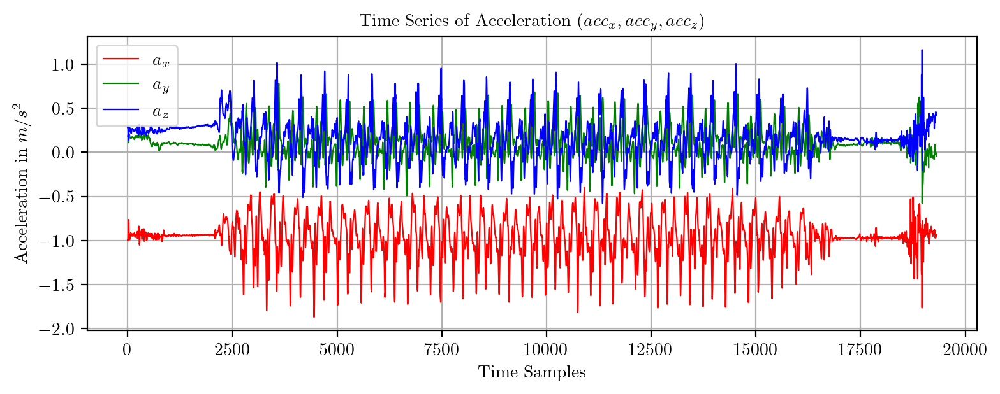

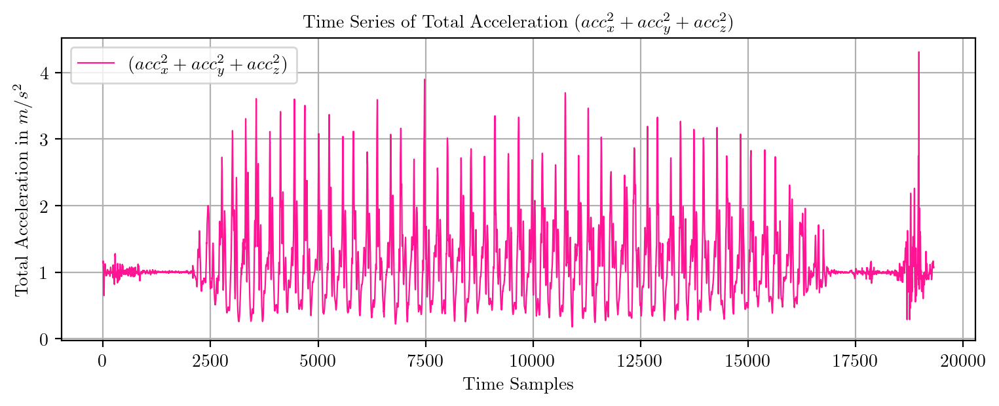

In [21]:
PlotTimeSeries(df, 1)
PlotTimeSeries(df, 0)

In [22]:
from scipy.signal import resample

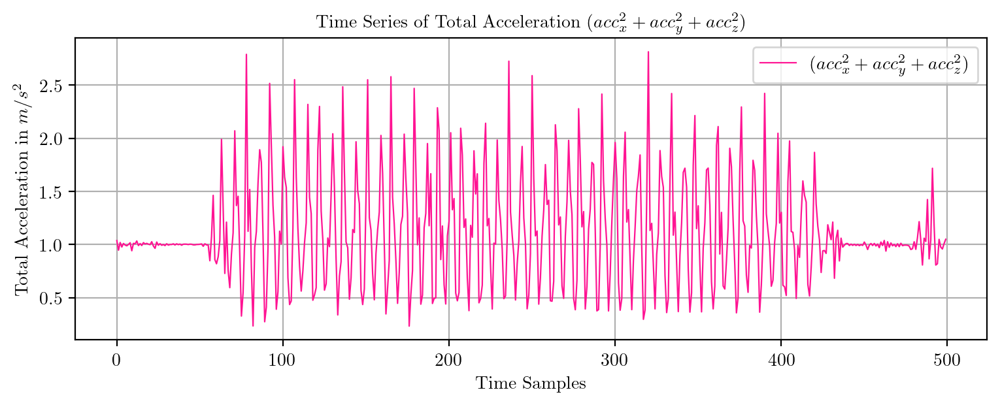

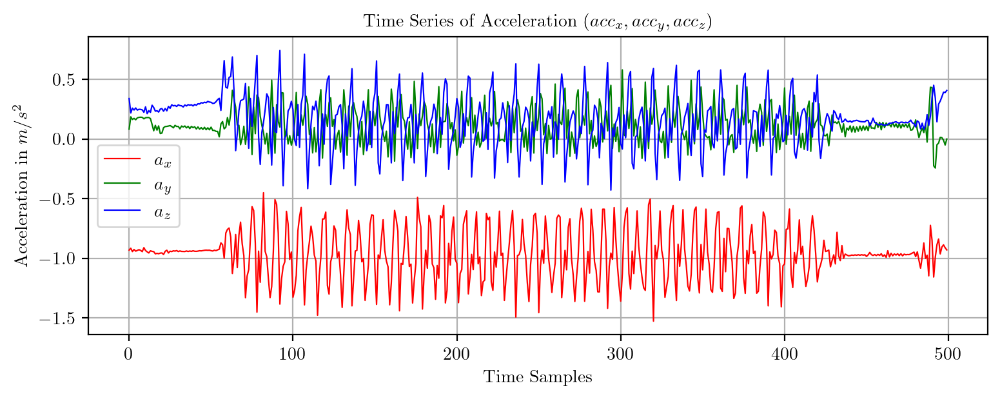

In [48]:
dfN = pd.DataFrame(resample(df, 500))
PlotTimeSeries(dfN, 0)
PlotTimeSeries(dfN, 1)

In [67]:
# flag = 1 -> Only display the orginal untrimmed TS and trim-prediction on flag != 1
def PredictPlot(filename,  flag = 1):
    df = getTimeSeries(filename)
    if flag:
        print("Original Time Series")
        PlotTimeSeries(df, 1)
        PlotTimeSeries(df, 0)
    else:
        df.drop(columns = ["time"], inplace = True)
        dfN = pd.DataFrame(resample(df, 500))
        dfN = fetchTotTS(dfN).T
        y_pred = model.predict(dfN)
        print(classesN[y_pred[0]])

Original Time Series


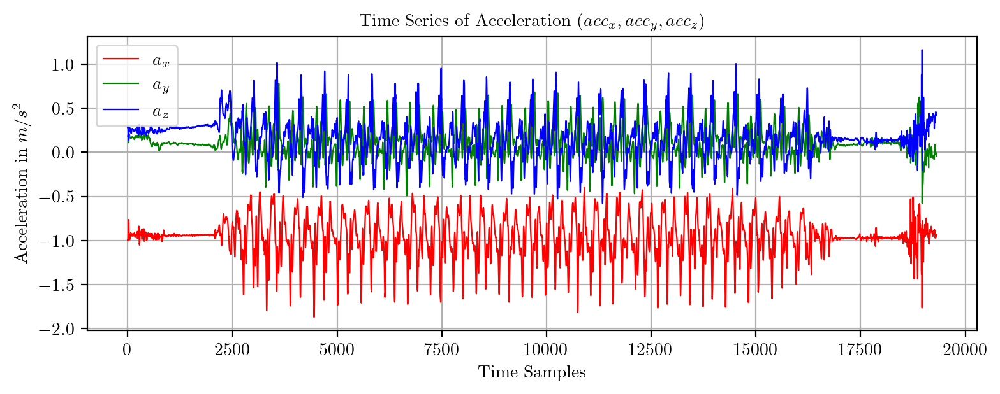

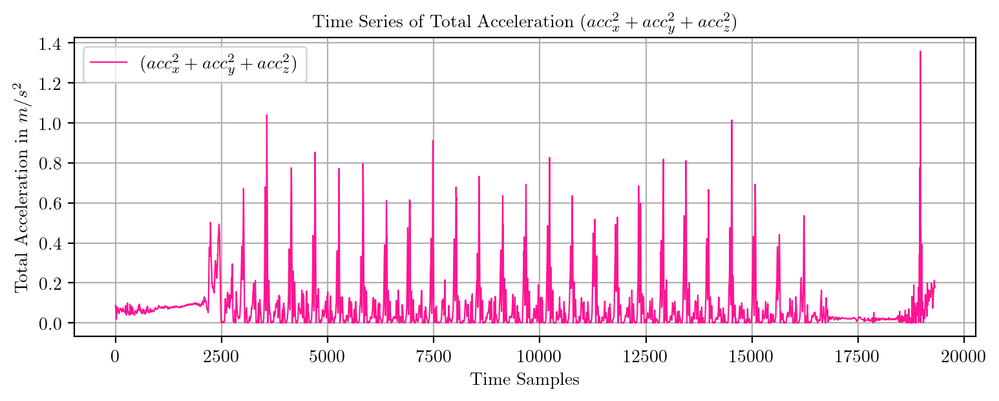

In [68]:
PredictPlot('TS2Walking.csv', 1)

In [69]:
PredictPlot('TS2Walking.csv', 0)

WALKING_DOWNSTAIRS


In [60]:
classesN

{1: 'WALKING',
 2: 'WALKING_UPSTAIRS',
 3: 'WALKING_DOWNSTAIRS',
 4: 'SITTING',
 5: 'STANDING',
 6: 'LAYING'}

Original Time Series


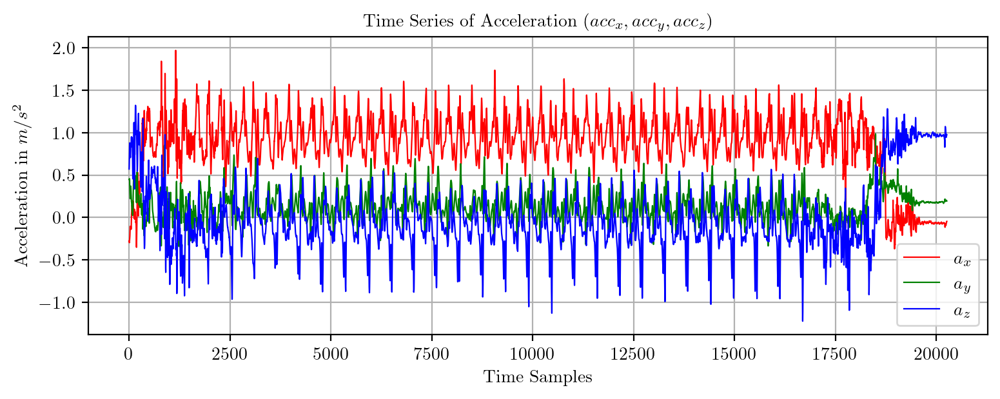

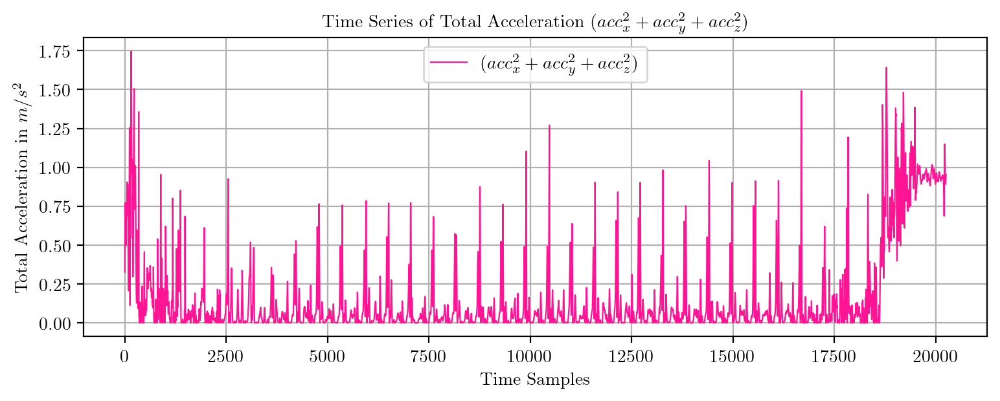

WALKING_DOWNSTAIRS


In [70]:
PredictPlot('TS4Walking.csv', 1)
PredictPlot('TS4Walking.csv', 0)

Original Time Series


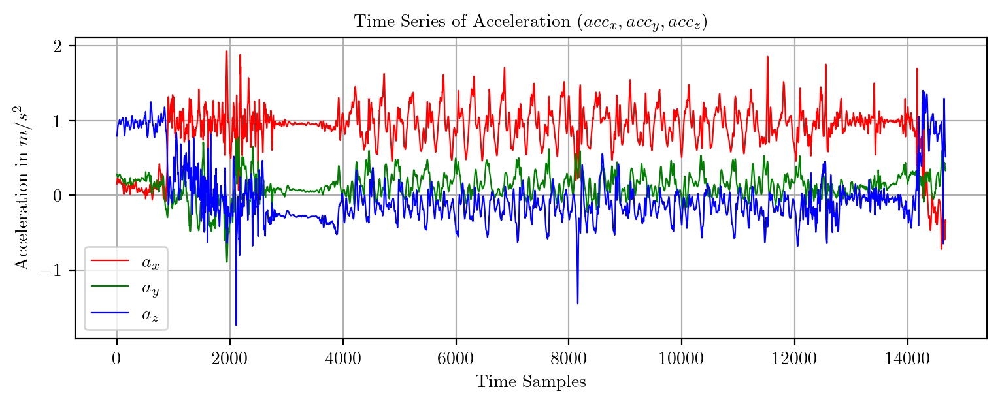

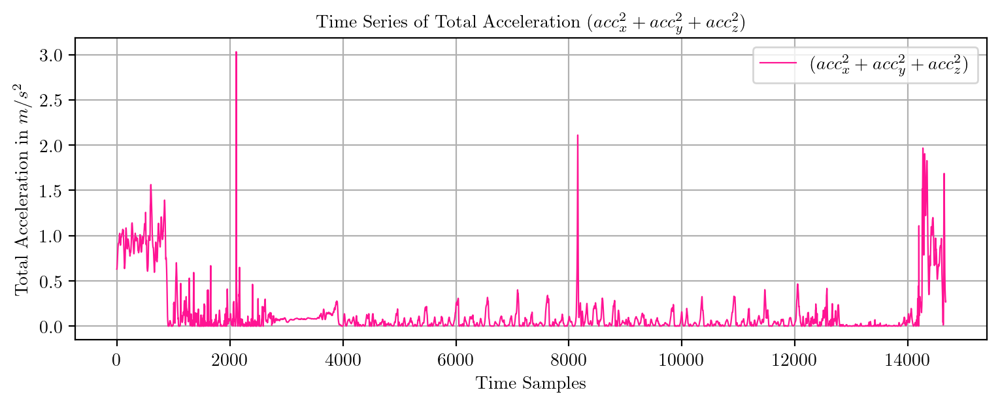

WALKING_UPSTAIRS


In [71]:
PredictPlot('TS5WalkingUpstairs.csv', 1)
PredictPlot('TS5WalkingUpstairs.csv', 0)

Original Time Series


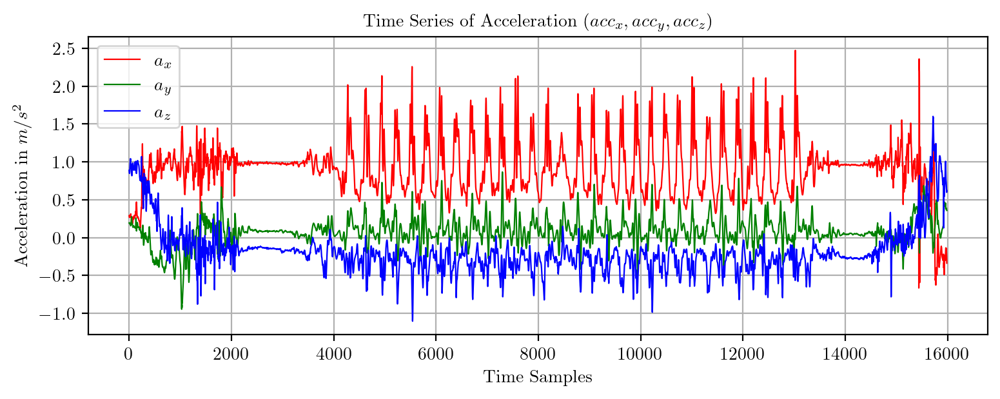

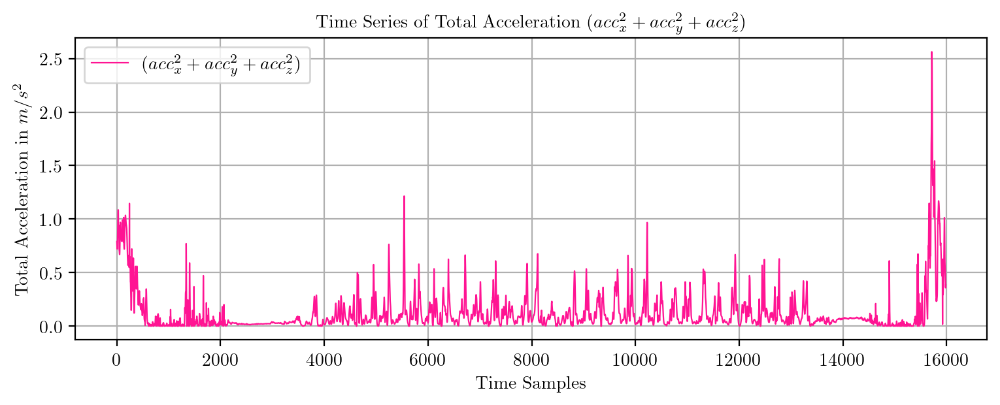

WALKING


In [72]:
PredictPlot('TS6WalkingDownstairs.csv', 1)
PredictPlot('TS6WalkingDownstairs.csv', 0)

Original Time Series


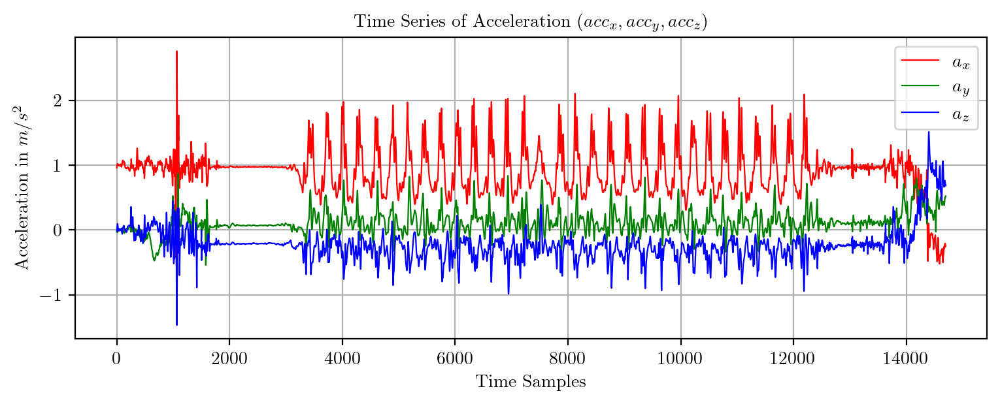

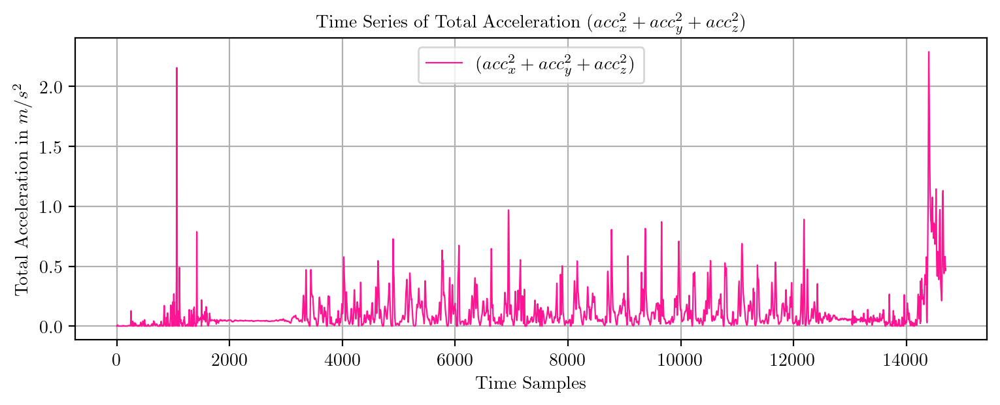

WALKING_DOWNSTAIRS


In [73]:
PredictPlot('TS7WalkingDownstairs.csv', 1)
PredictPlot('TS7WalkingDownstairs.csv', 0)

Original Time Series


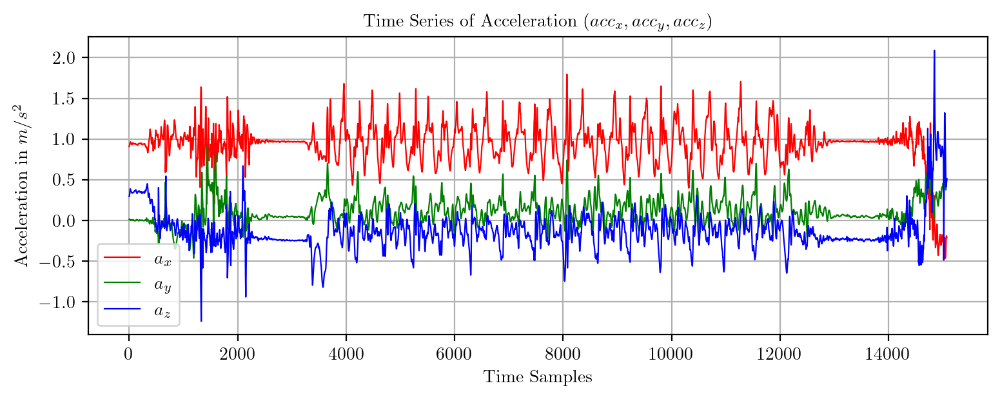

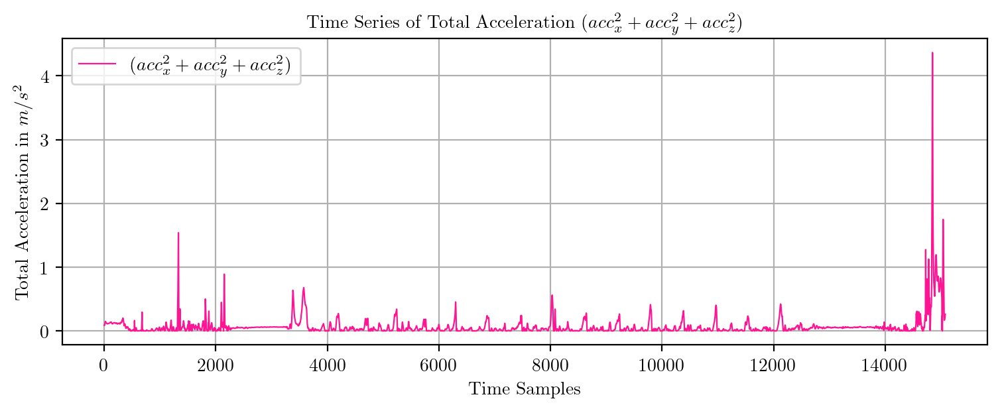

WALKING_DOWNSTAIRS


In [74]:
PredictPlot('TS8WalkingUpstairs.csv', 1)
PredictPlot('TS8WalkingUpstairs.csv', 0)

Original Time Series


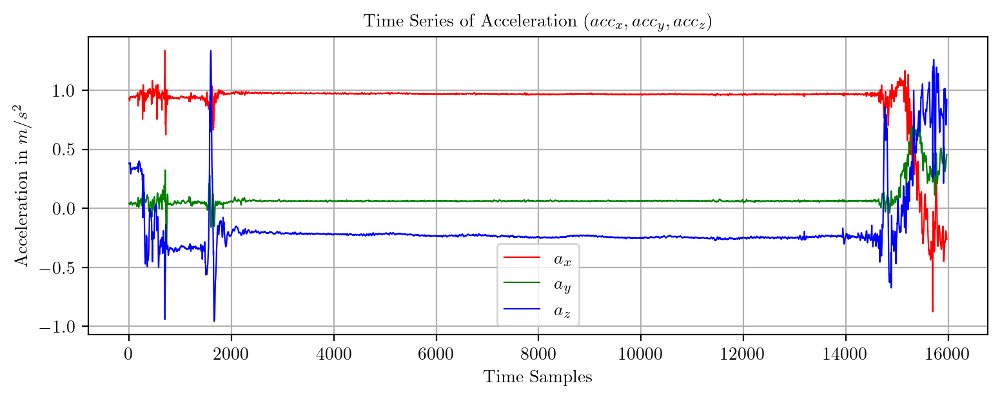

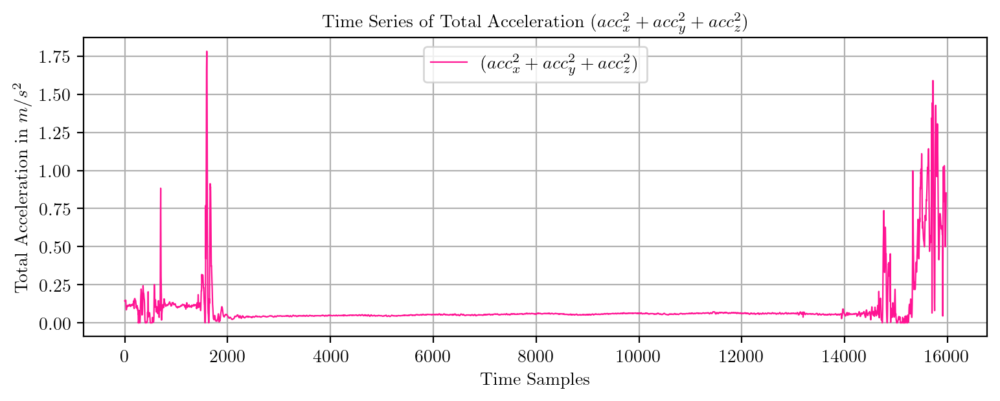

SITTING


In [75]:
PredictPlot('TS9Sitting.csv', 1)
PredictPlot('TS9Sitting.csv', 0)

Original Time Series


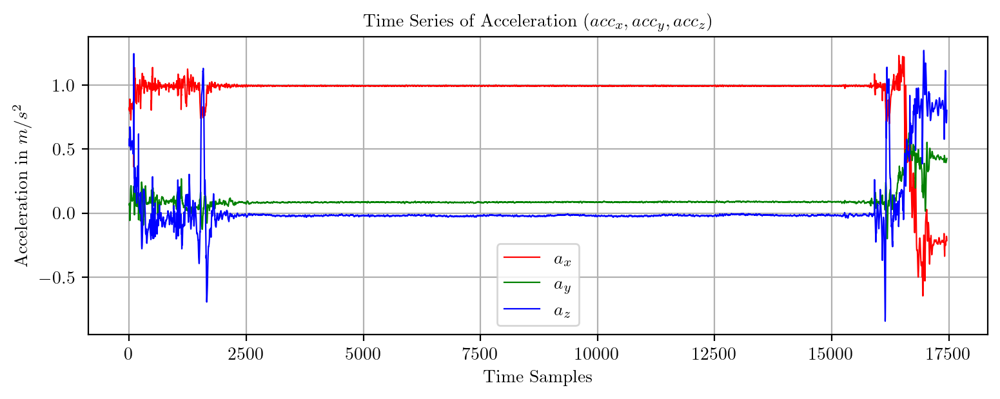

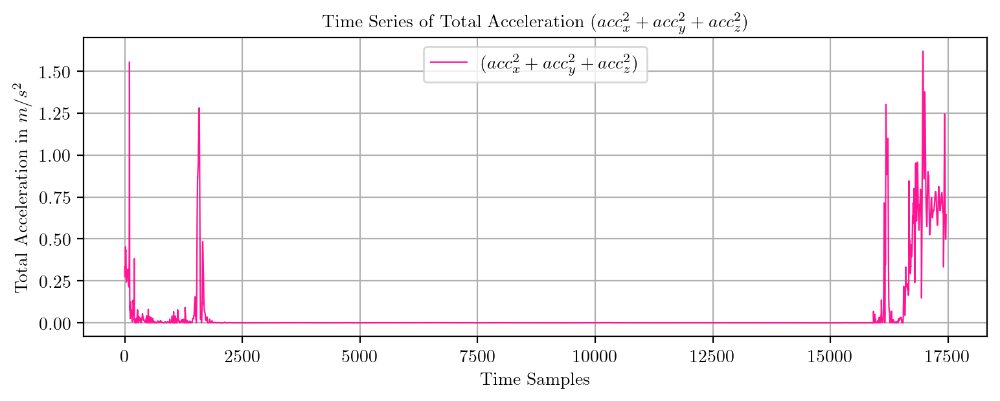

SITTING


In [76]:
PredictPlot('TS10Sitting.csv', 1)
PredictPlot('TS10Sitting.csv', 0)

Original Time Series


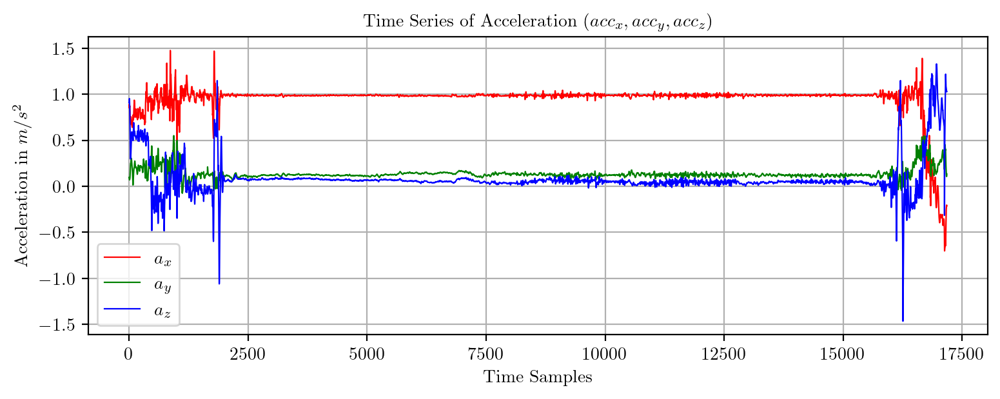

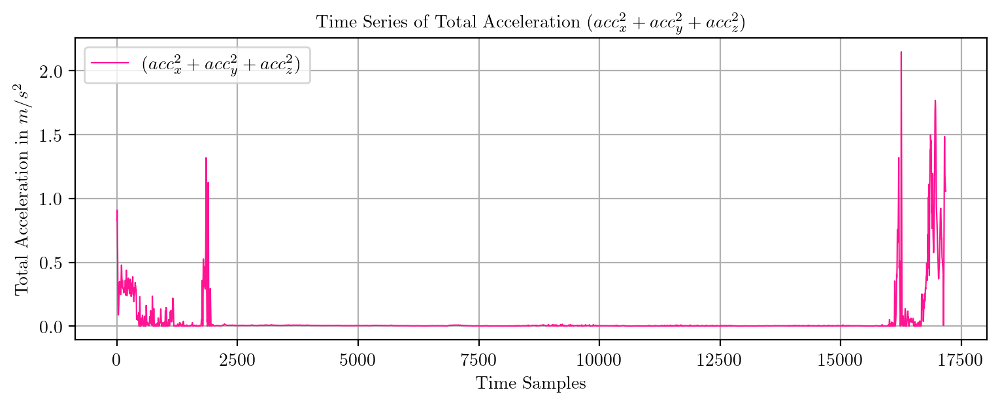

SITTING


In [77]:
PredictPlot('TS11Standing.csv', 1)
PredictPlot('TS11Standing.csv', 0)

Original Time Series


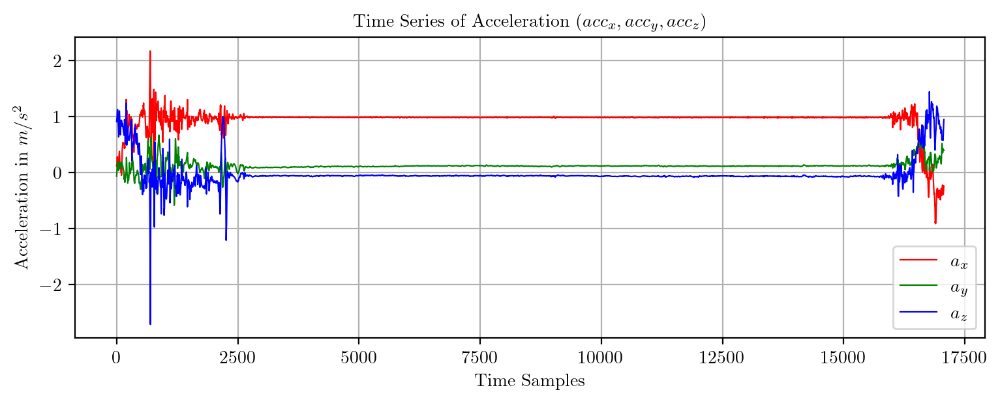

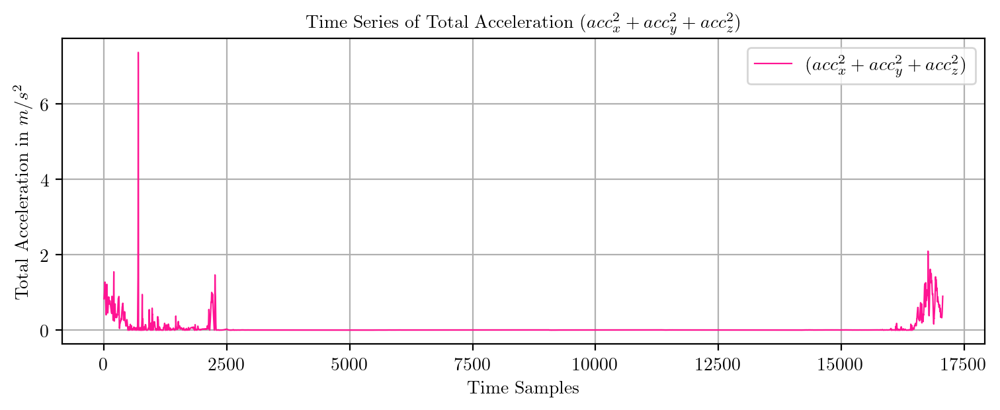

SITTING


In [78]:
PredictPlot('TS12Standing.csv', 1)
PredictPlot('TS12Standing.csv', 0)

Original Time Series


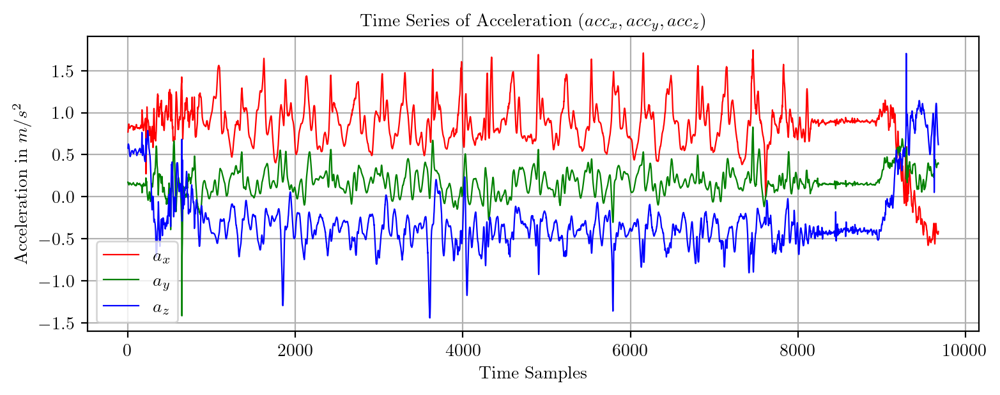

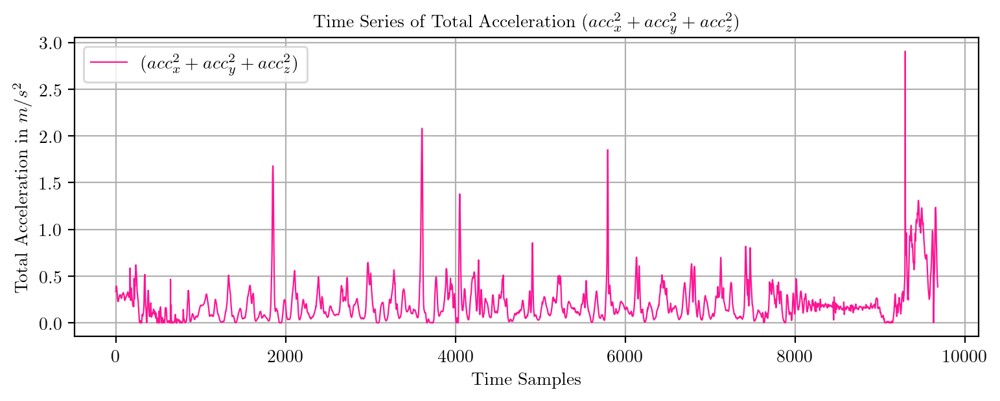

WALKING_DOWNSTAIRS


In [79]:
PredictPlot('TS14WalkingUpstairs.csv', 1)
PredictPlot('TS14WalkingUpstairs.csv', 0)

Original Time Series


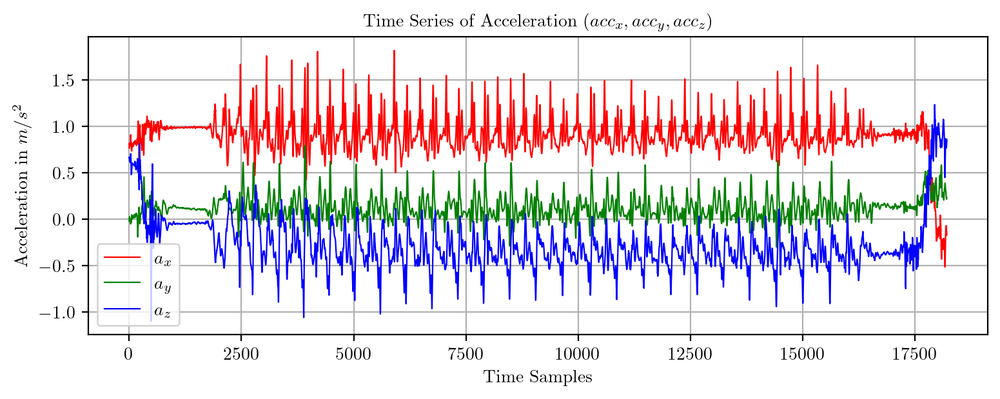

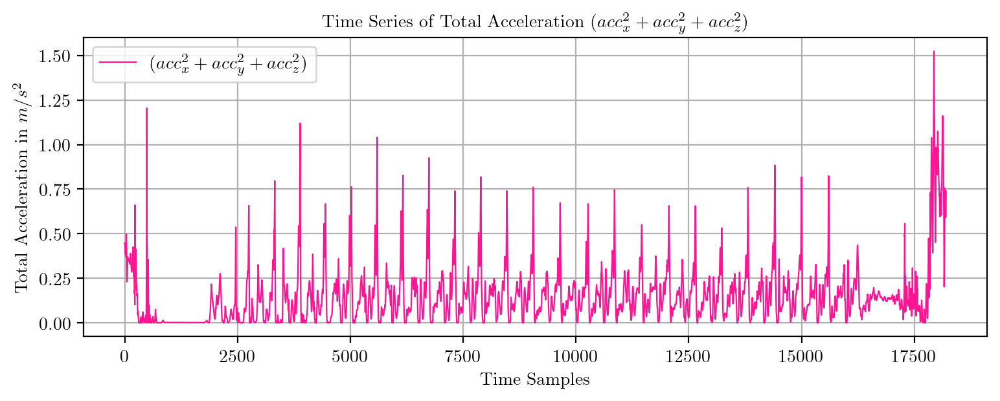

WALKING_DOWNSTAIRS


In [80]:
PredictPlot('TS15Walking.csv', 1)
PredictPlot('TS15Walking.csv', 0)

Original Time Series


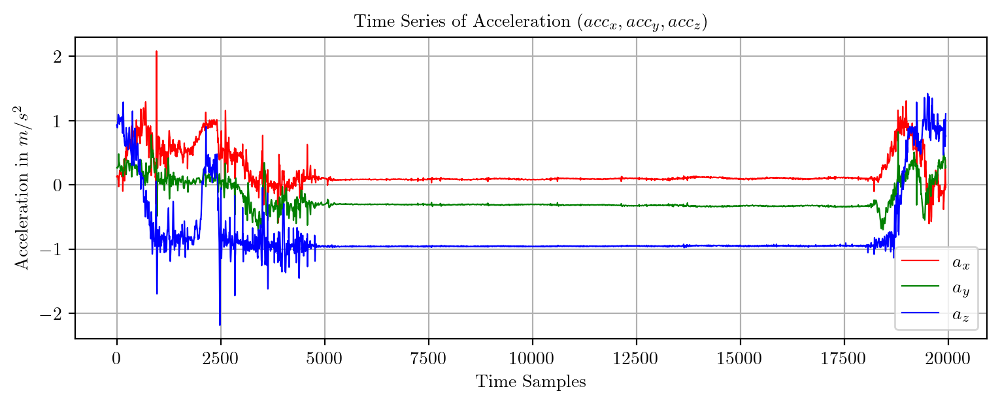

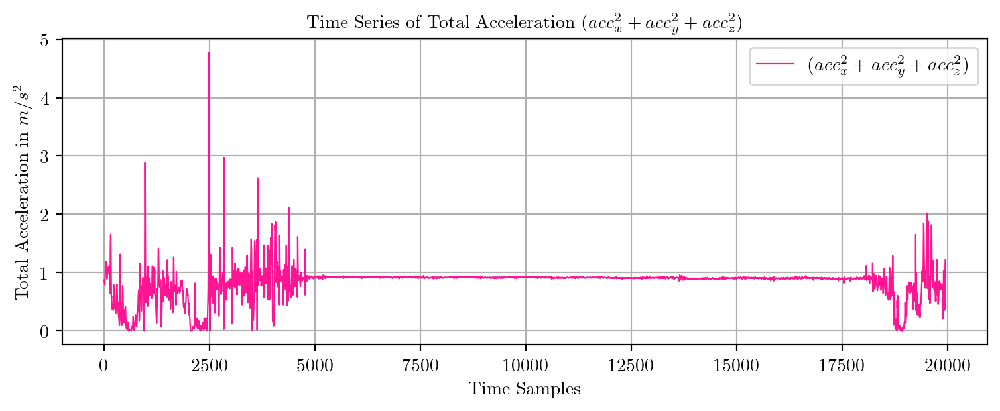

WALKING_UPSTAIRS


In [81]:
PredictPlot('TS16Laying.csv', 1)
PredictPlot('TS16Laying.csv', 0)

Original Time Series


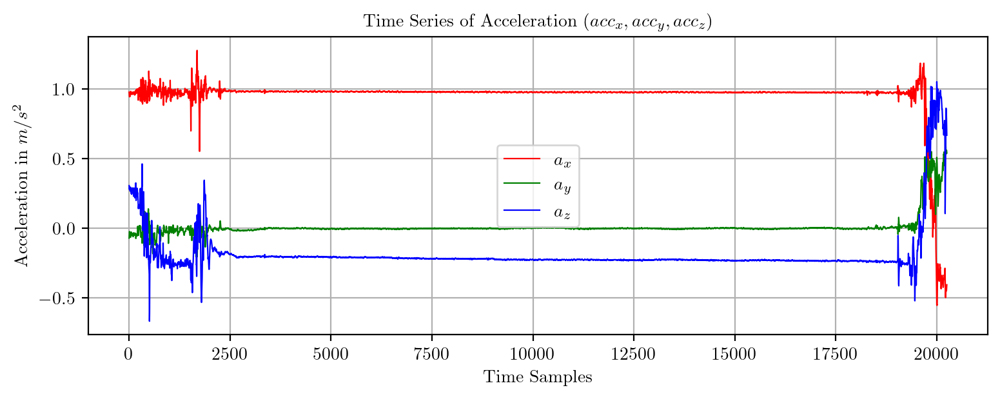

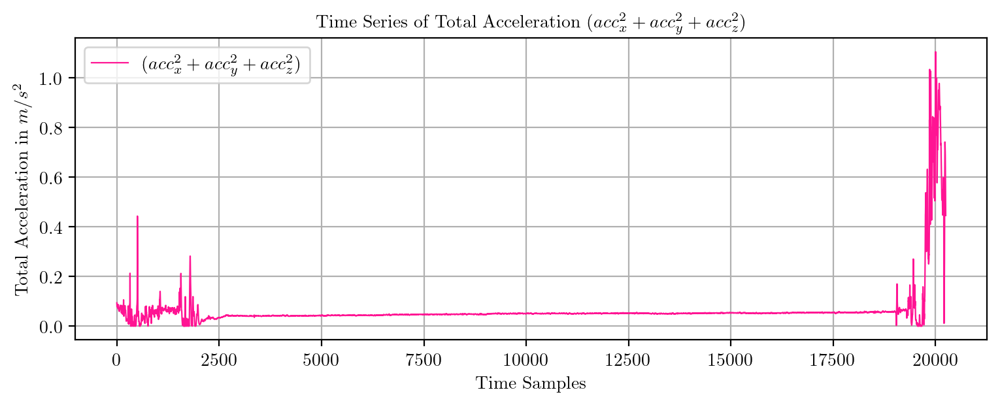

LAYING


In [82]:
PredictPlot('TS17Sitting.csv', 1)
PredictPlot('TS17Sitting.csv', 0)

Original Time Series


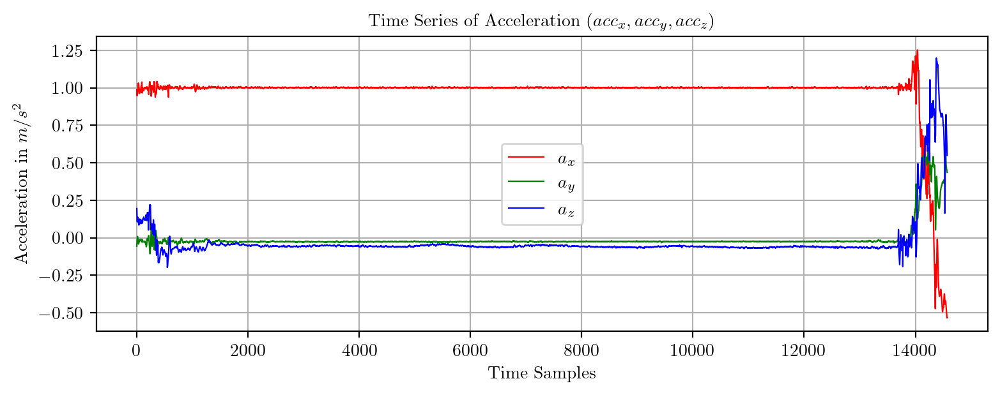

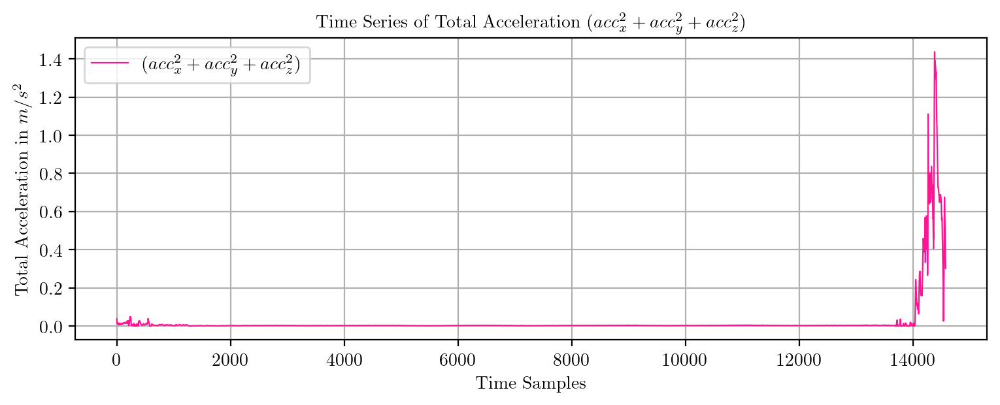

SITTING


In [83]:
PredictPlot('TS18Sitting.csv', 1)
PredictPlot('TS18Sitting.csv', 0)

Original Time Series


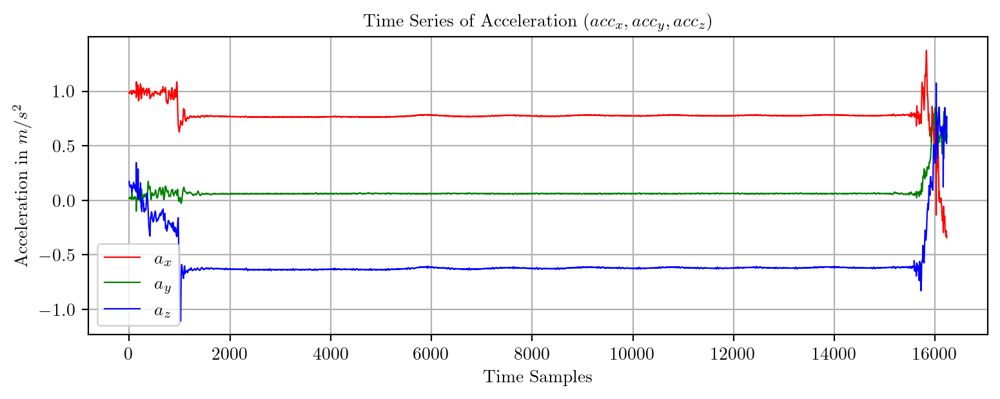

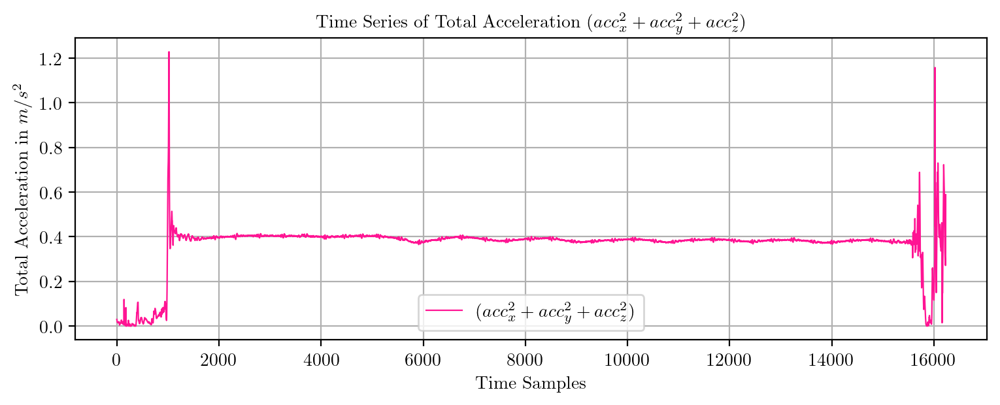

LAYING


In [84]:
PredictPlot('TS19Sitting.csv', 1)
PredictPlot('TS19Sitting.csv', 0)

Original Time Series


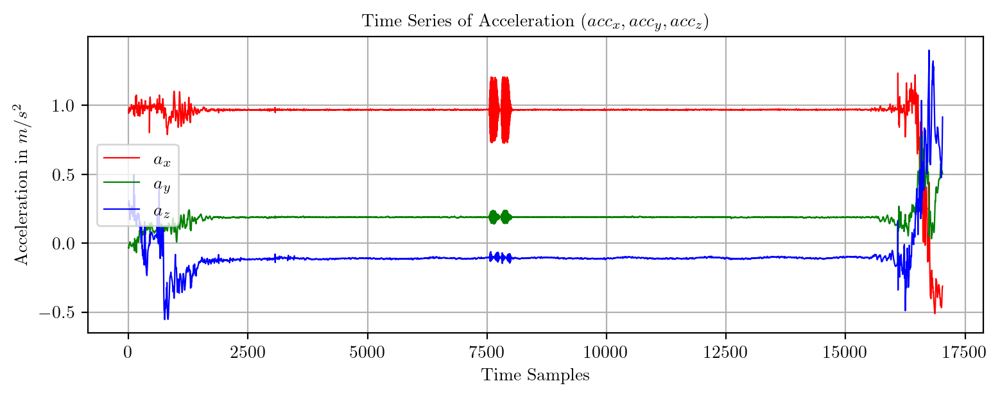

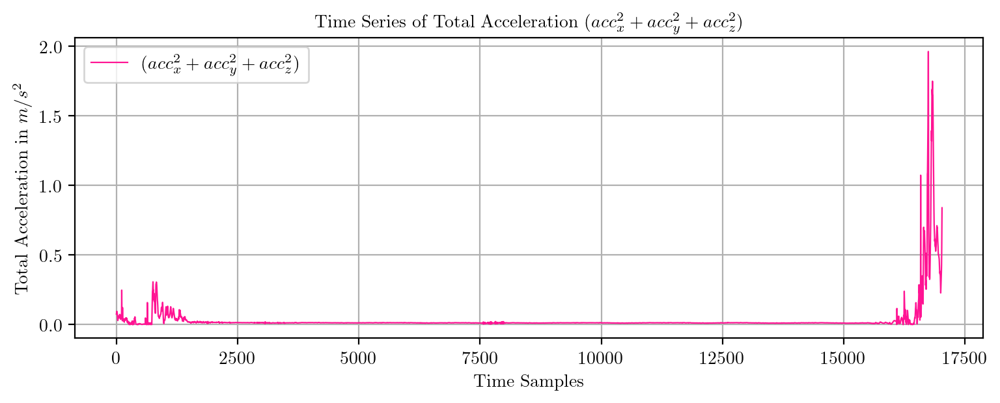

LAYING


In [85]:
PredictPlot('TS20Sitting.csv', 1)
PredictPlot('TS20Sitting.csv', 0)

Original Time Series


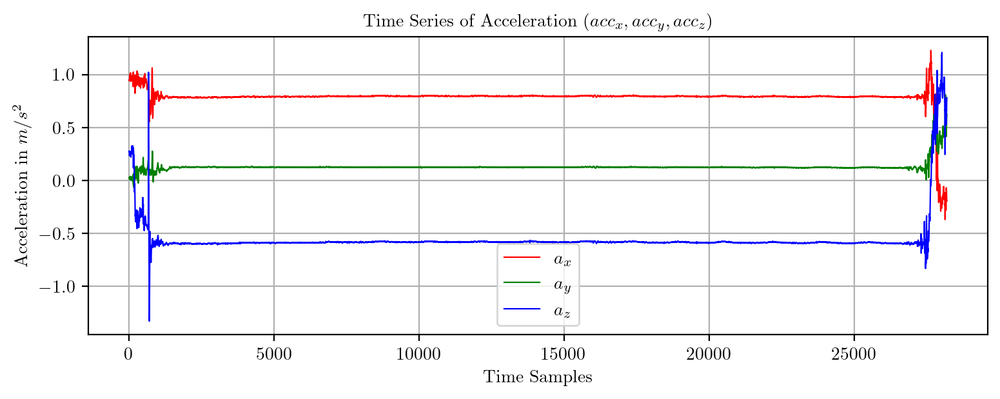

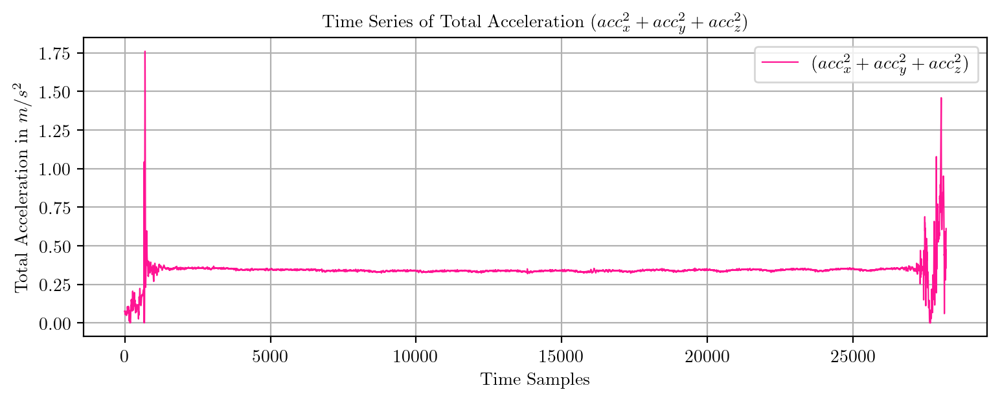

LAYING


In [86]:
PredictPlot('TS21Sitting.csv', 1)
PredictPlot('TS21Sitting.csv', 0)

Original Time Series


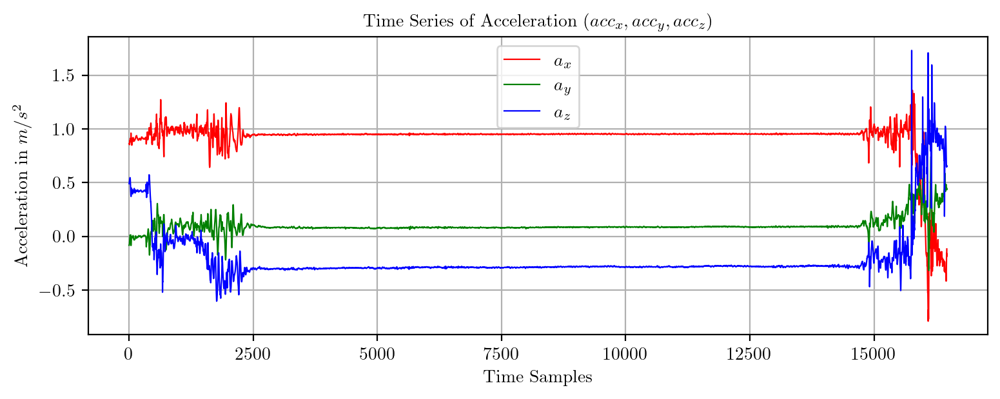

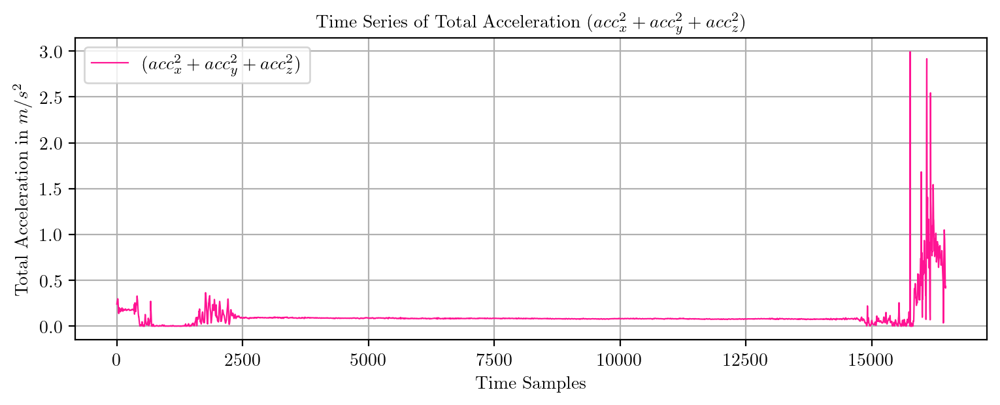

LAYING


In [87]:
PredictPlot('TS22Standing.csv', 1)
PredictPlot('TS22Standing.csv', 0)

Original Time Series


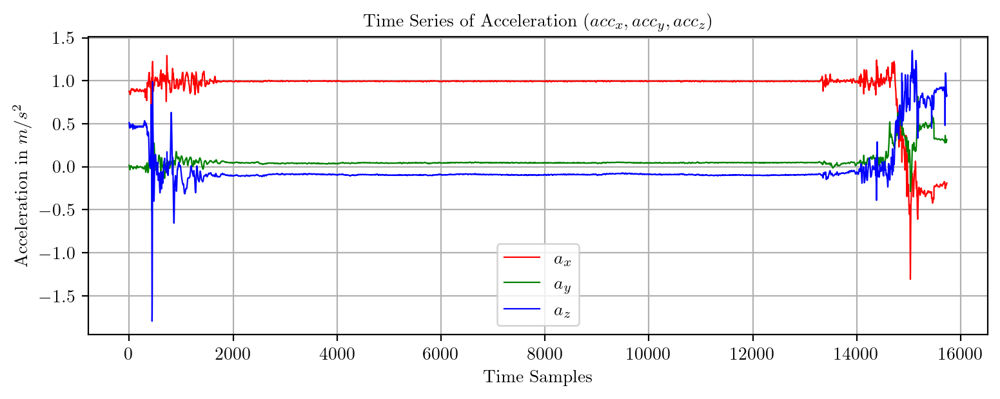

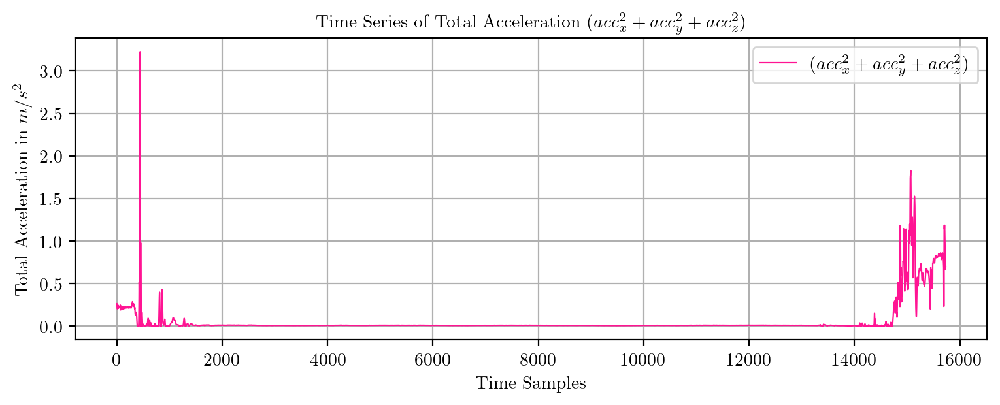

SITTING


In [88]:
PredictPlot('TS23Standing.csv', 1)
PredictPlot('TS23Standing.csv', 0)

Original Time Series


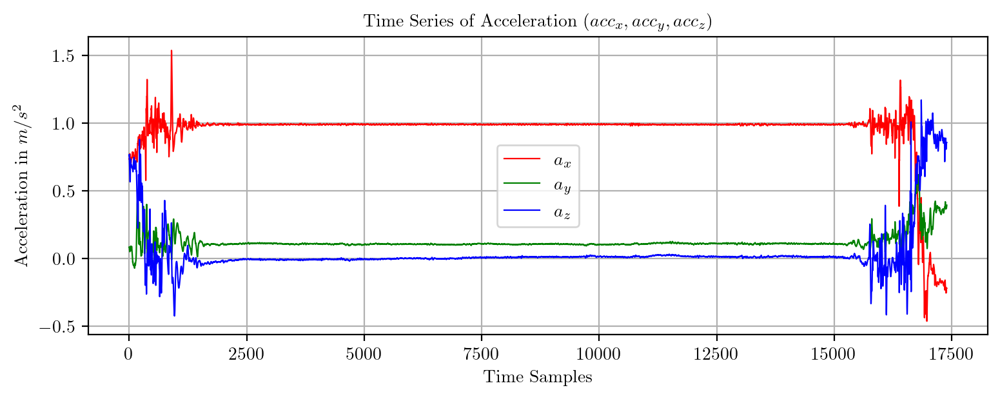

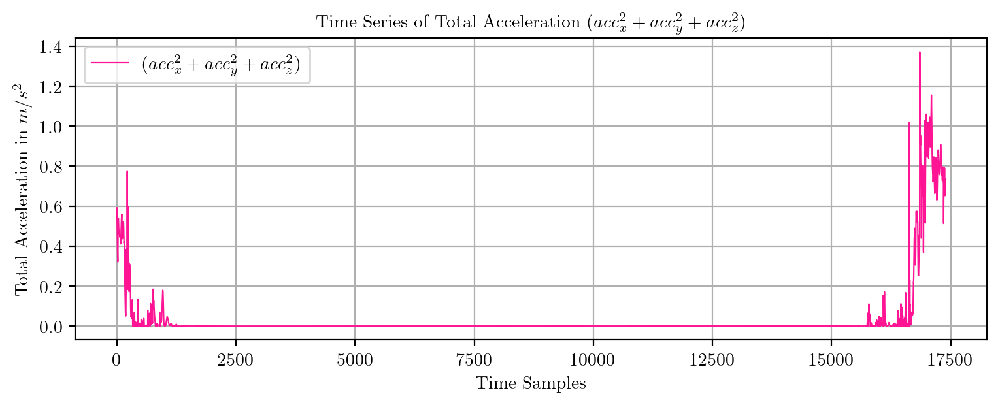

SITTING


In [89]:
PredictPlot('TS24Standing.csv', 1)
PredictPlot('TS24Standing.csv', 0)

Original Time Series


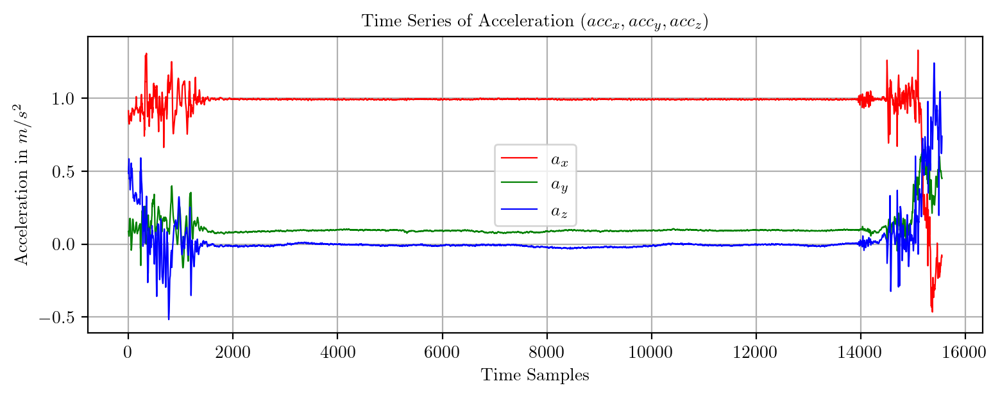

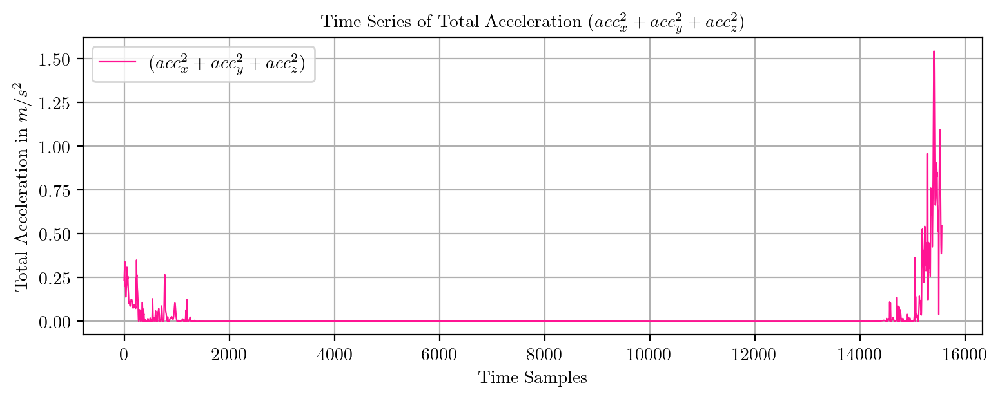

LAYING


In [90]:
PredictPlot('TS25Standing.csv', 1)
PredictPlot('TS25Standing.csv', 0)

Original Time Series


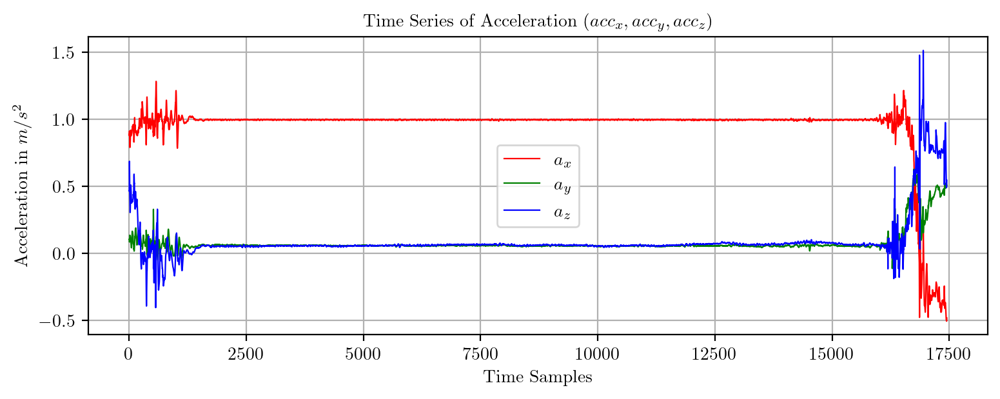

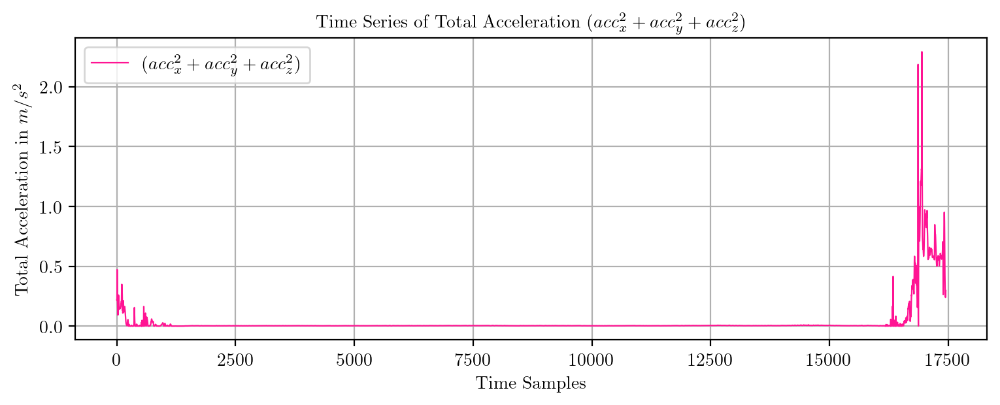

LAYING


In [91]:
PredictPlot('TS26Standing.csv', 1)
PredictPlot('TS26Standing.csv', 0)

Original Time Series


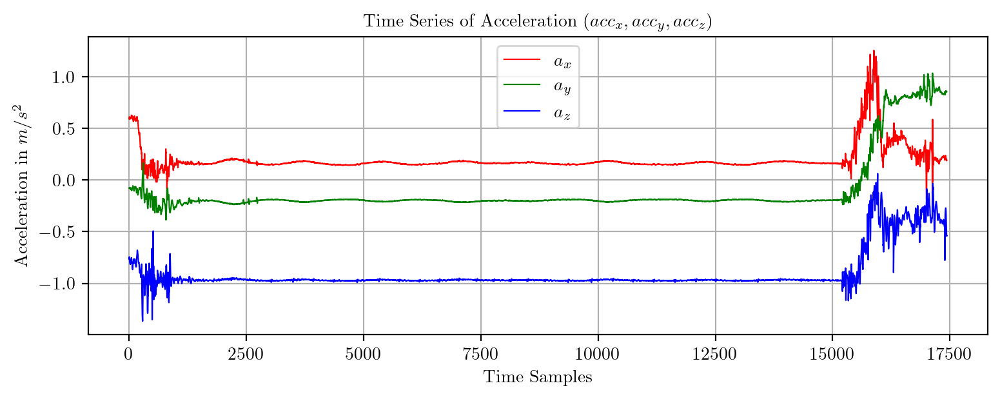

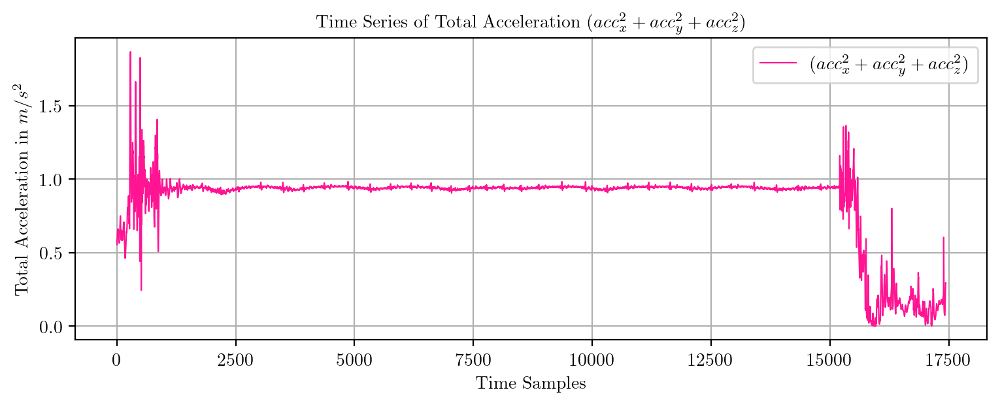

WALKING_UPSTAIRS


In [92]:
PredictPlot('TS27Laying.csv', 1)
PredictPlot('TS27Laying.csv', 0)

Original Time Series


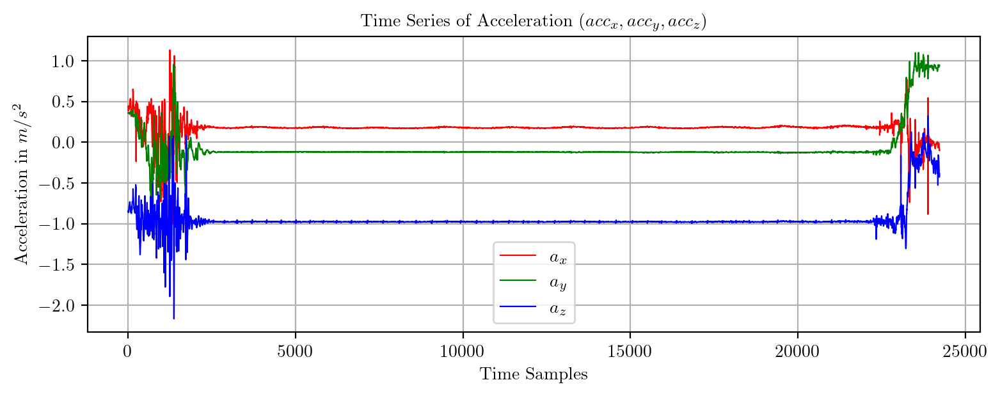

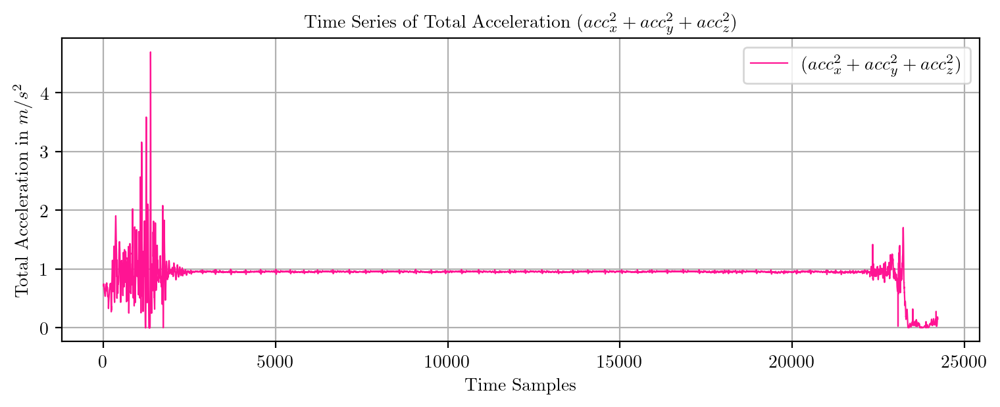

WALKING_UPSTAIRS


In [93]:
PredictPlot('TS28Laying.csv', 1)
PredictPlot('TS28Laying.csv', 0)

Original Time Series


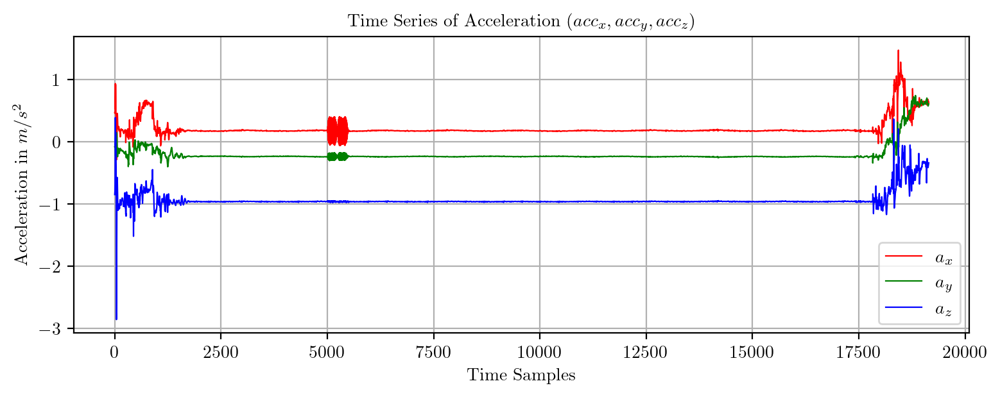

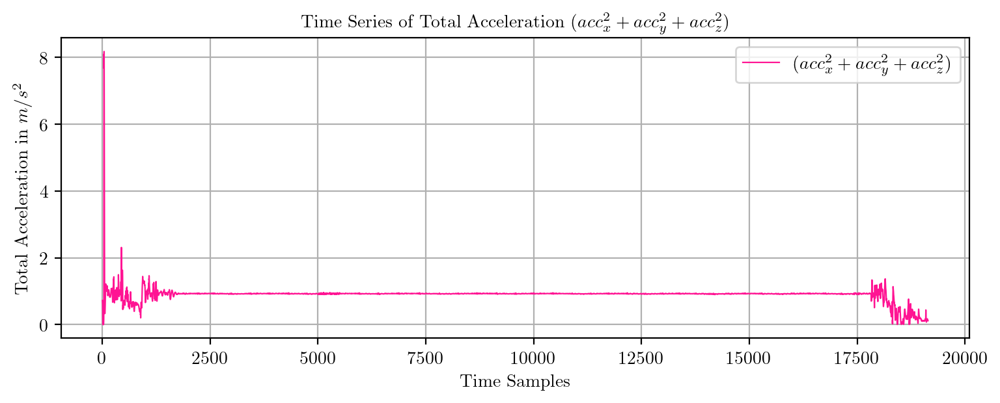

WALKING_UPSTAIRS


In [94]:
PredictPlot('TS29Laying.csv', 1)
PredictPlot('TS29Laying.csv', 0)

Original Time Series


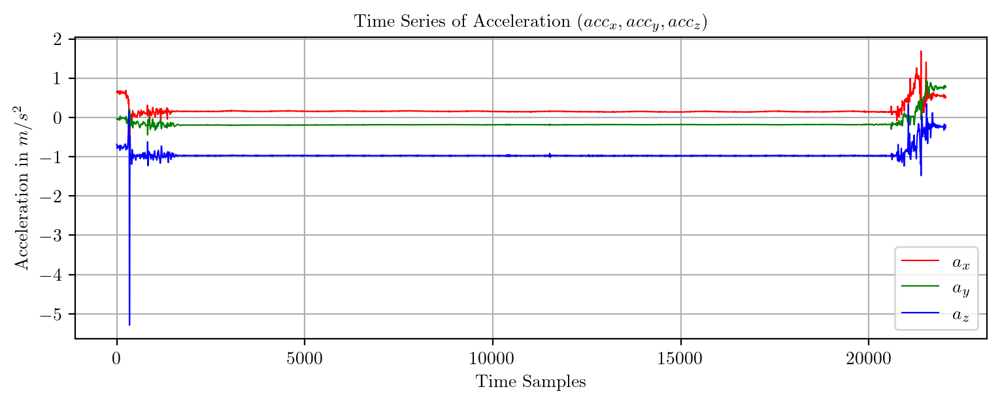

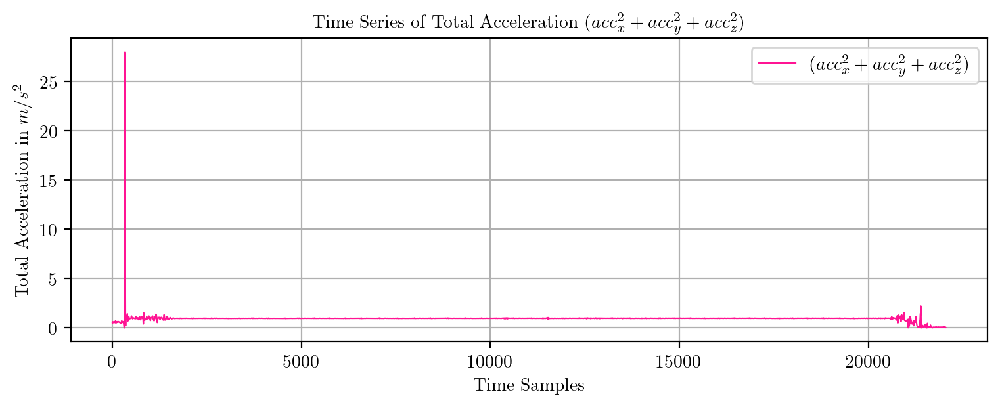

WALKING_UPSTAIRS


In [95]:
PredictPlot('TS30Laying.csv', 1)
PredictPlot('TS30Laying.csv', 0)

Original Time Series


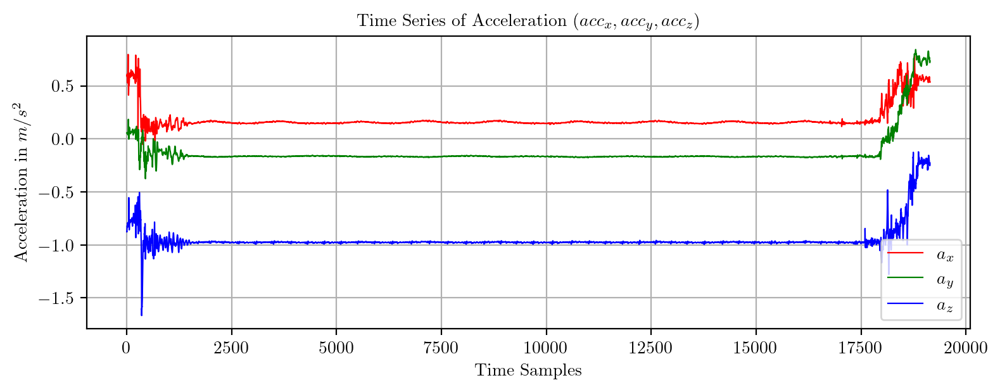

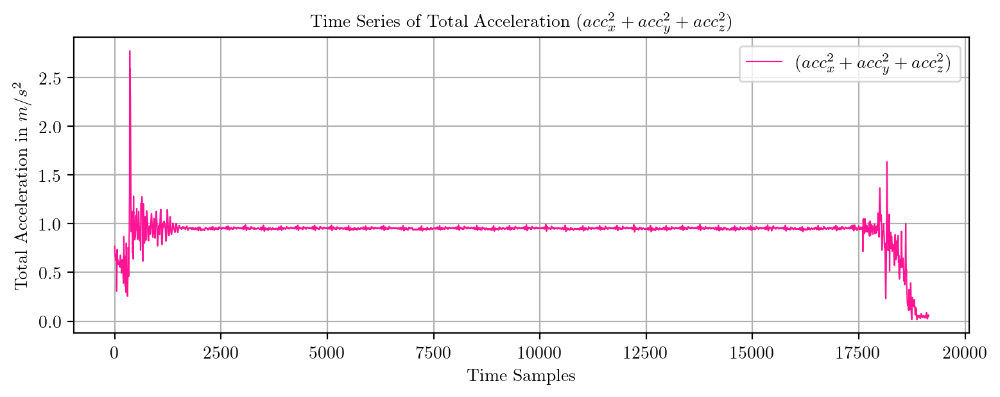

WALKING_UPSTAIRS


In [96]:
PredictPlot('TS31Laying.csv', 1)
PredictPlot('TS31Laying.csv', 0)

Original Time Series


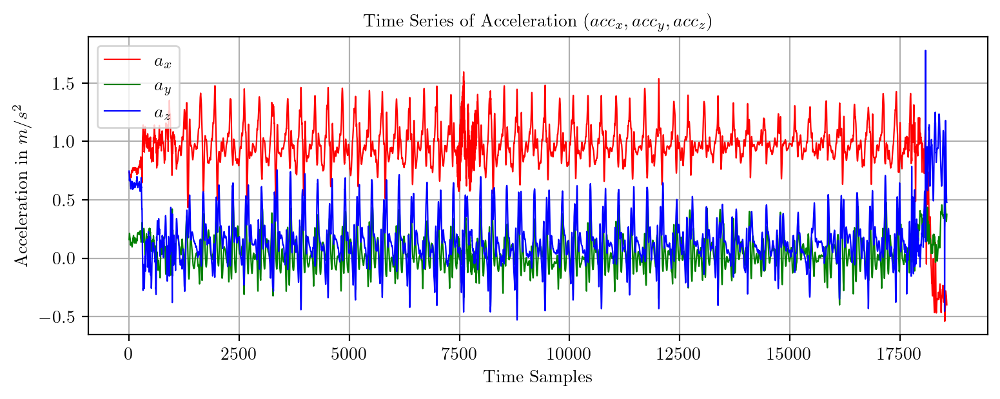

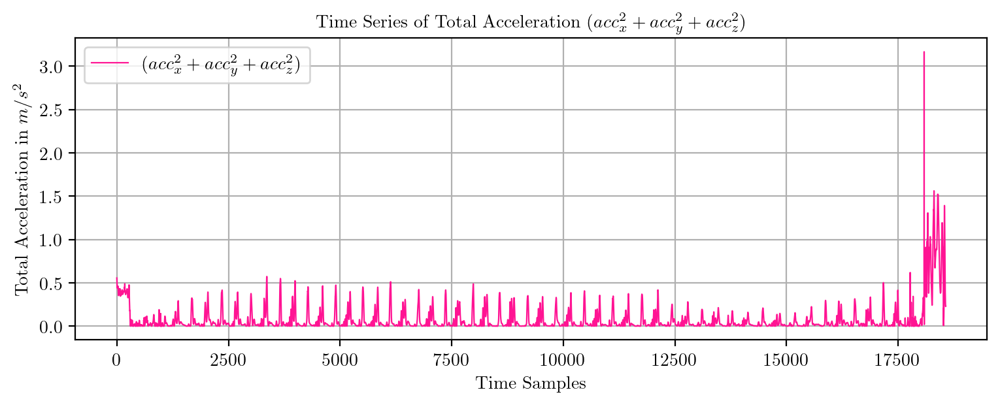

WALKING_UPSTAIRS


In [97]:
PredictPlot('TS32Walking.csv', 1)
PredictPlot('TS32Walking.csv', 0)

Original Time Series


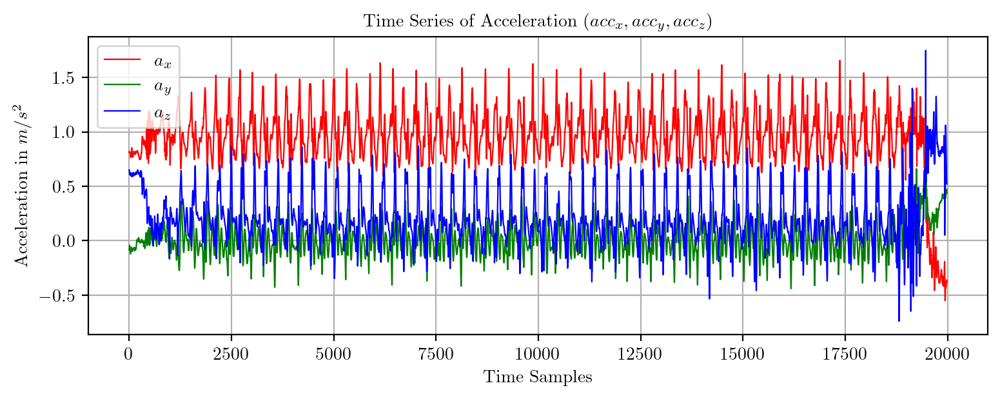

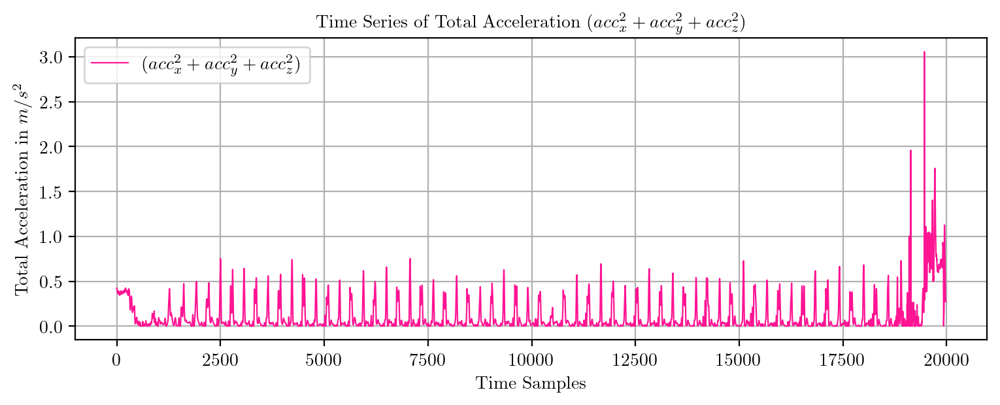

WALKING


In [98]:
PredictPlot('TS33Walking.csv', 1)
PredictPlot('TS33Walking.csv', 0)

Original Time Series


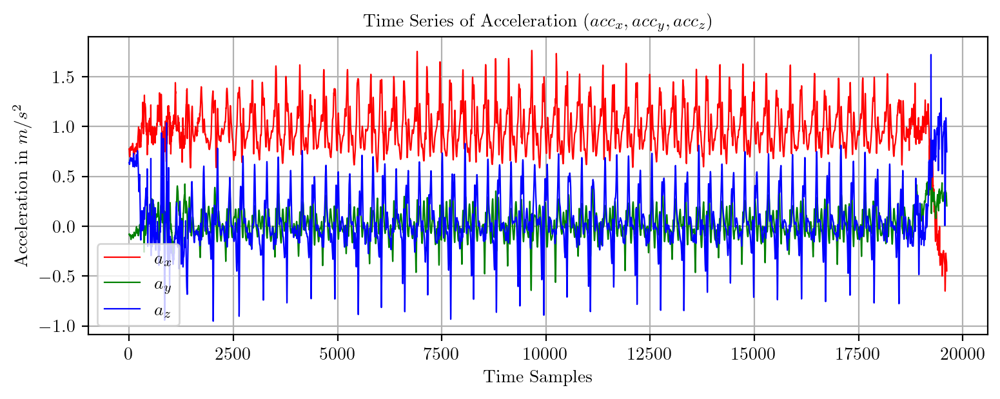

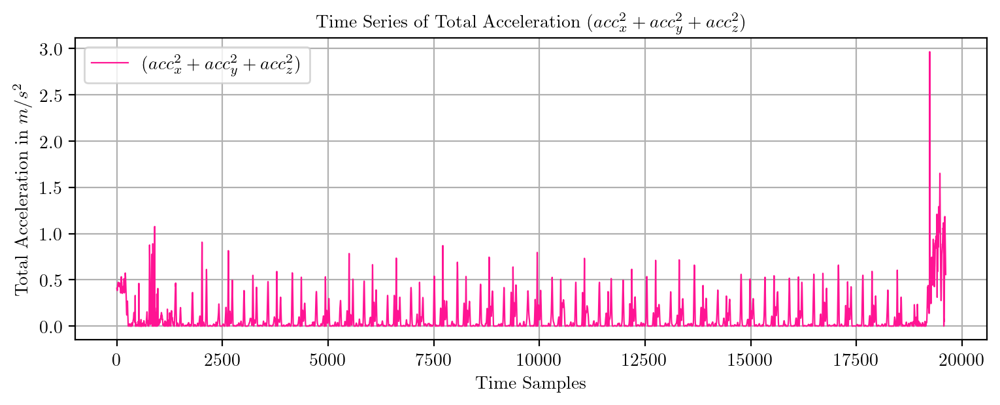

WALKING_UPSTAIRS


In [99]:
PredictPlot('TS34Walking.csv', 1)
PredictPlot('TS34Walking.csv', 0)

Original Time Series


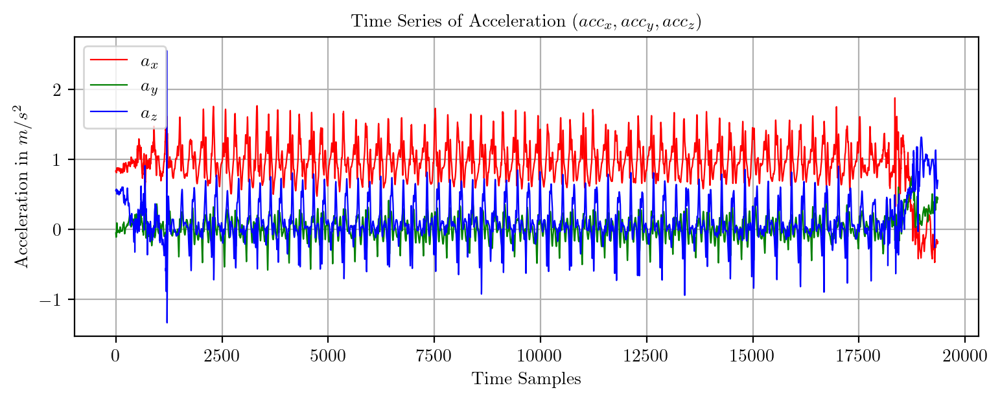

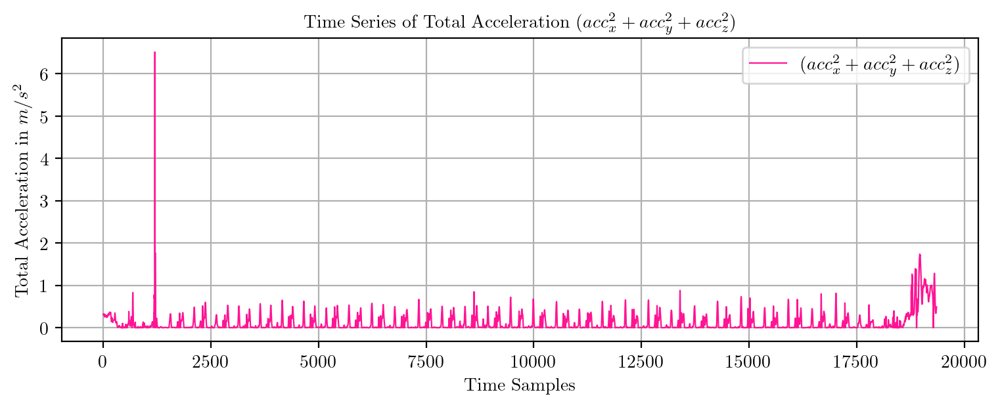

WALKING


In [100]:
PredictPlot('TS35Walking.csv', 1)
PredictPlot('TS35Walking.csv', 0)

Original Time Series


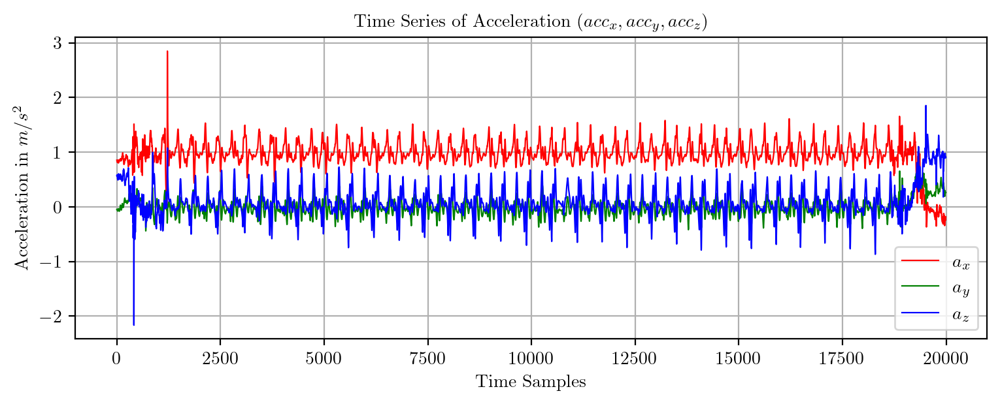

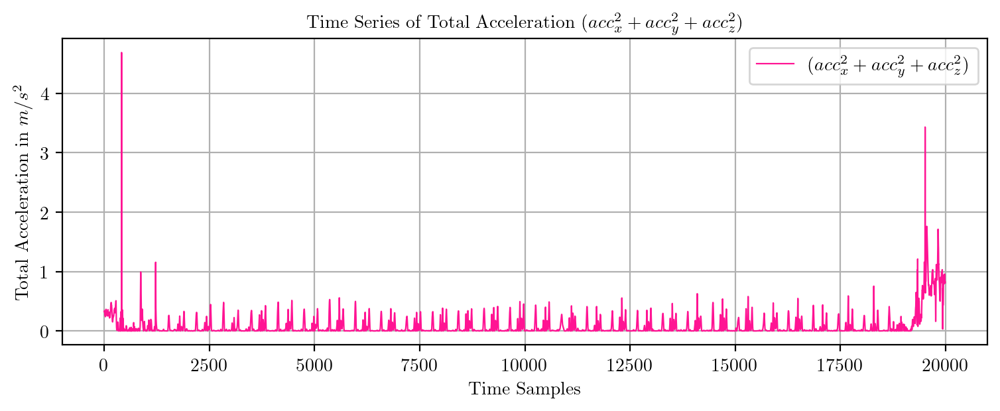

WALKING


In [101]:
PredictPlot('TS36Walking.csv', 1)
PredictPlot('TS36Walking.csv', 0)

Original Time Series


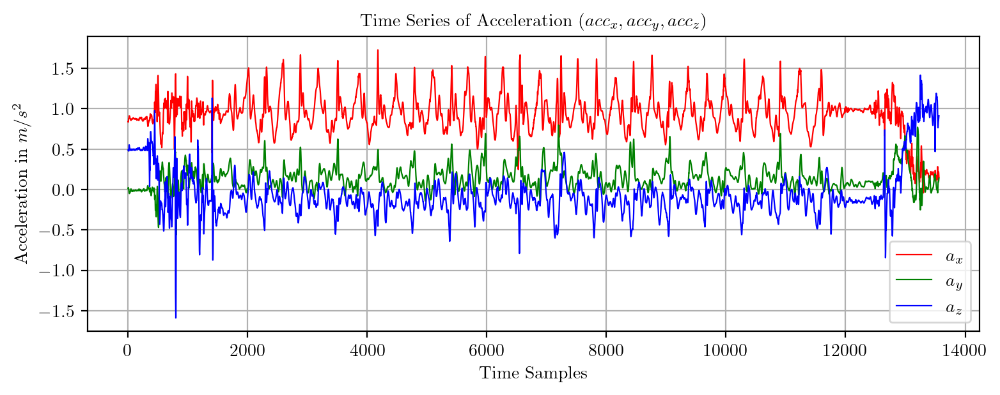

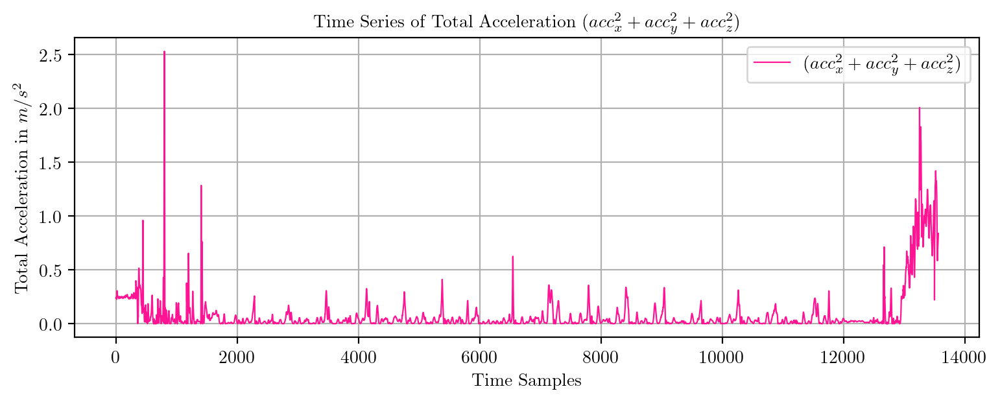

WALKING


In [102]:
PredictPlot('TS37Upstairs.csv', 1)
PredictPlot('TS37Upstairs.csv', 0)

Original Time Series


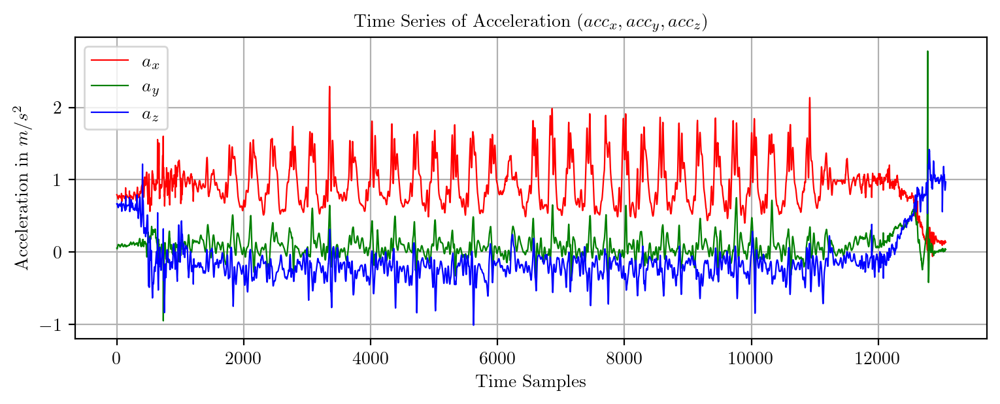

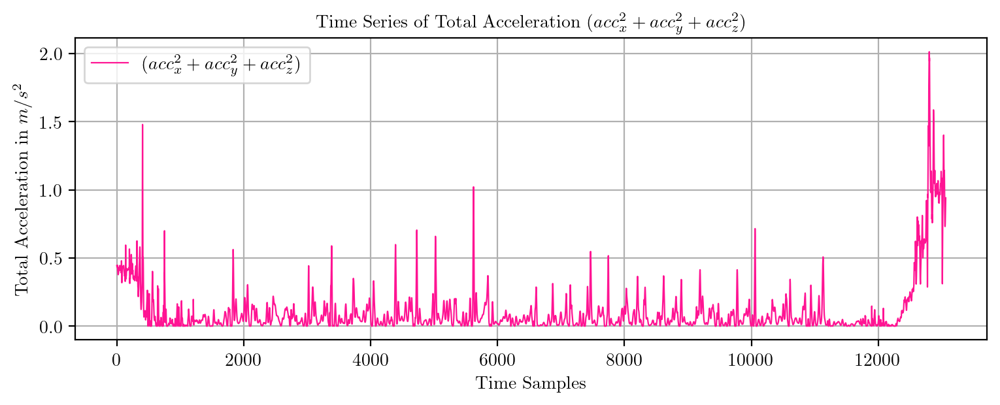

WALKING_DOWNSTAIRS


In [103]:
PredictPlot('TS38Downstairs.csv', 1)
PredictPlot('TS38Downstairs.csv', 0)

Original Time Series


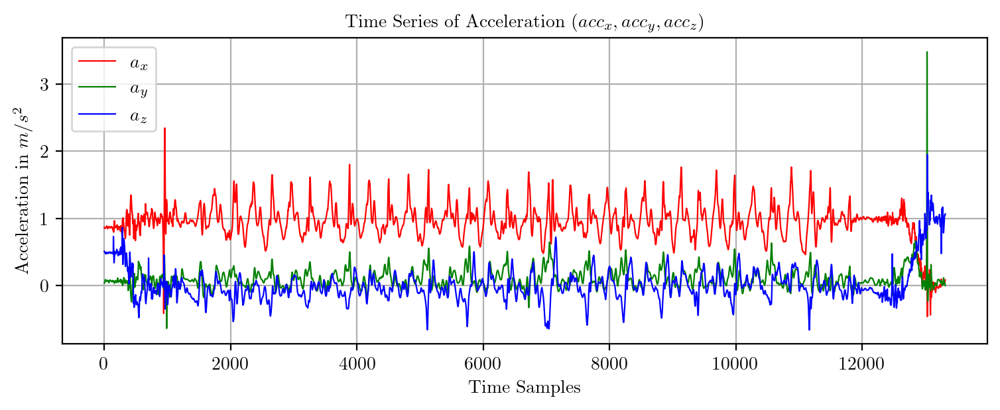

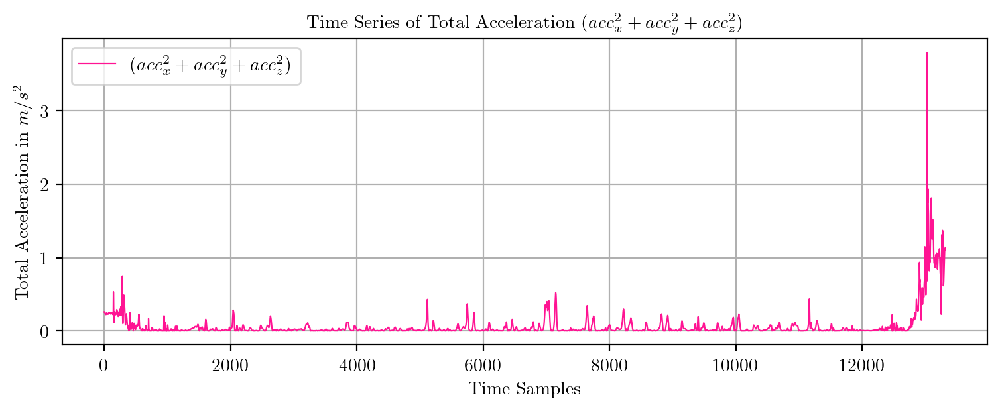

WALKING_UPSTAIRS


In [104]:
PredictPlot('TS39Upstairs.csv', 1)
PredictPlot('TS39Upstairs.csv', 0)

Original Time Series


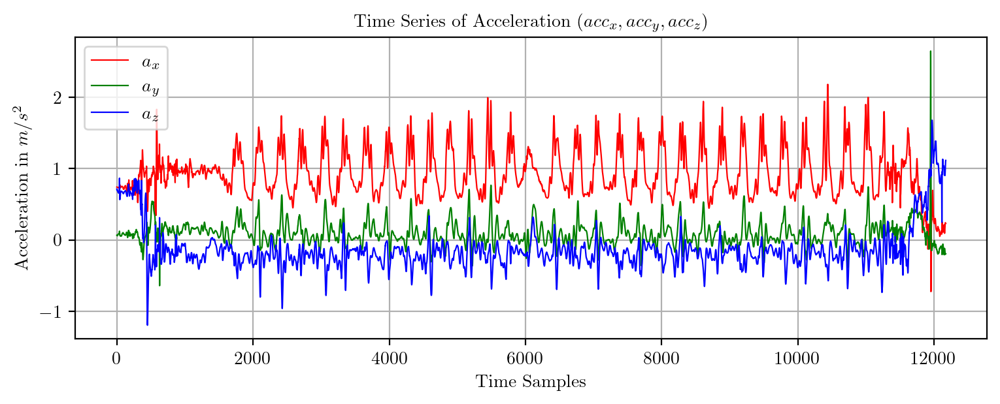

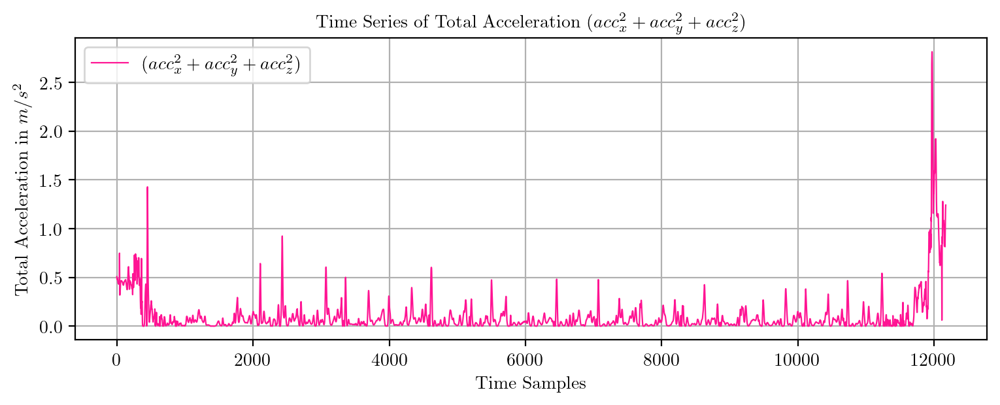

WALKING


In [105]:
PredictPlot('TS40Downstairs.csv', 1)
PredictPlot('TS40Downstairs.csv', 0)

Original Time Series


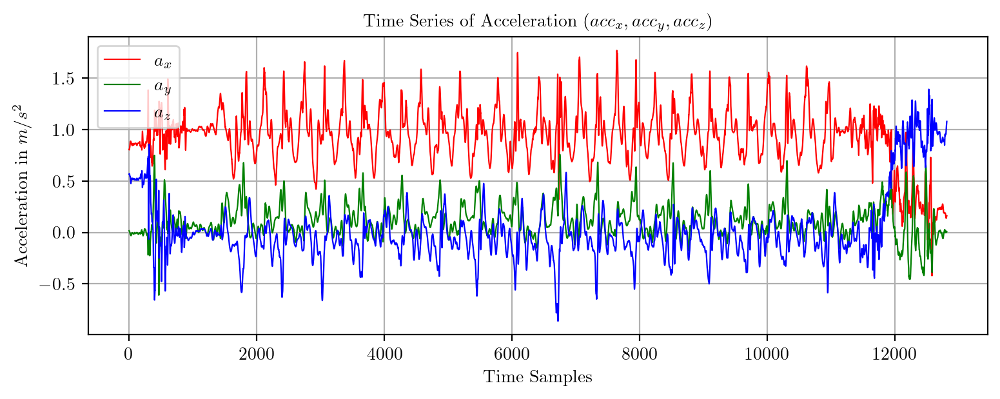

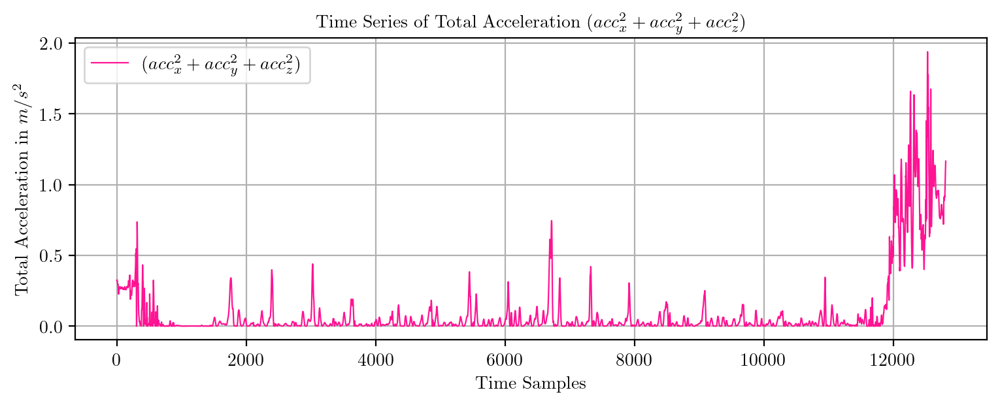

WALKING


In [106]:
PredictPlot('TS41Upstairs.csv', 1)
PredictPlot('TS41Upstairs.csv', 0)

Original Time Series


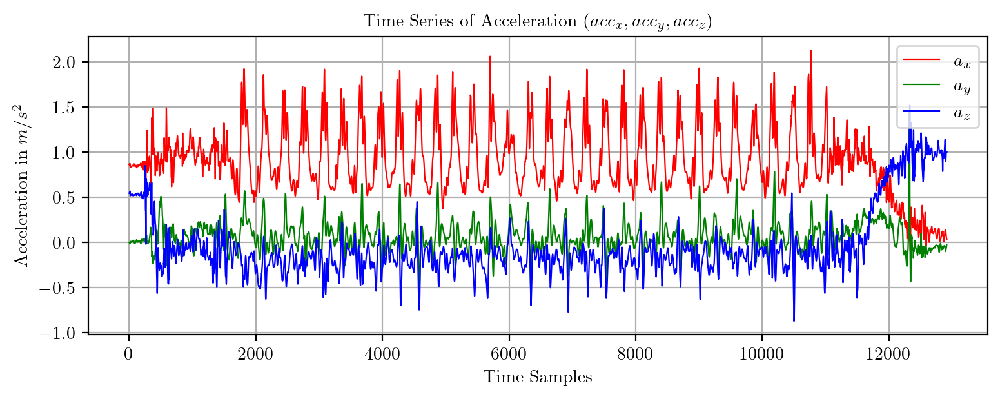

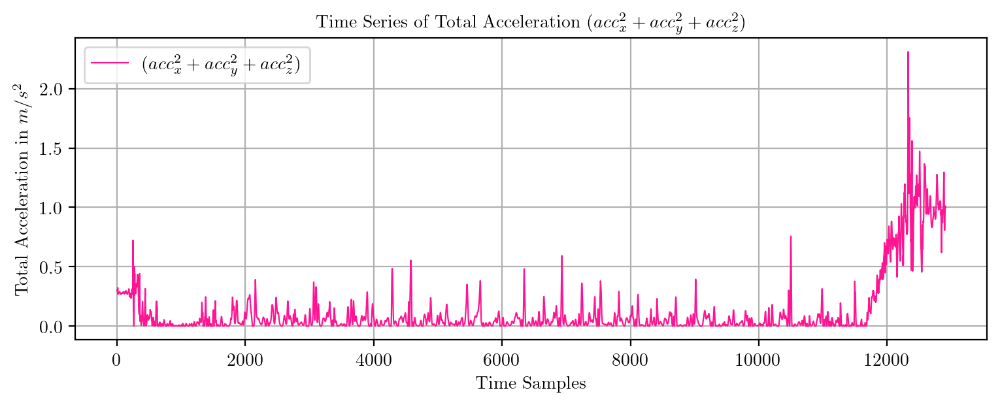

WALKING_UPSTAIRS


In [107]:
PredictPlot('TS42Downstairs.csv', 1)
PredictPlot('TS42Downstairs.csv', 0)

Original Time Series


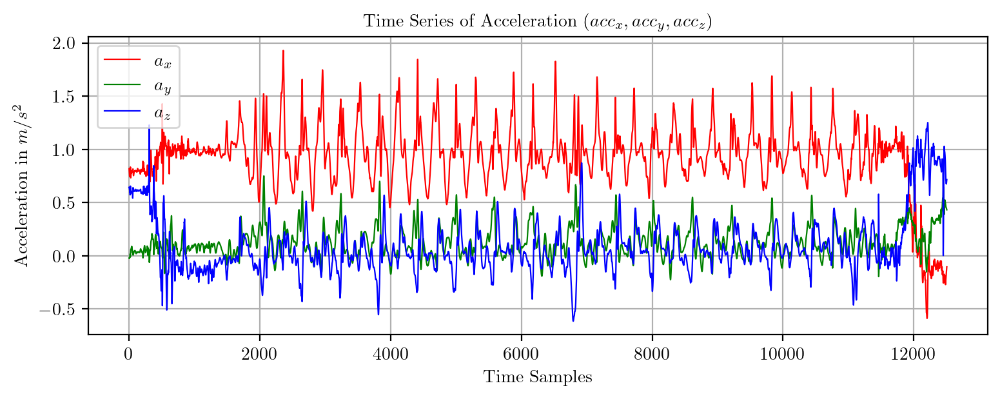

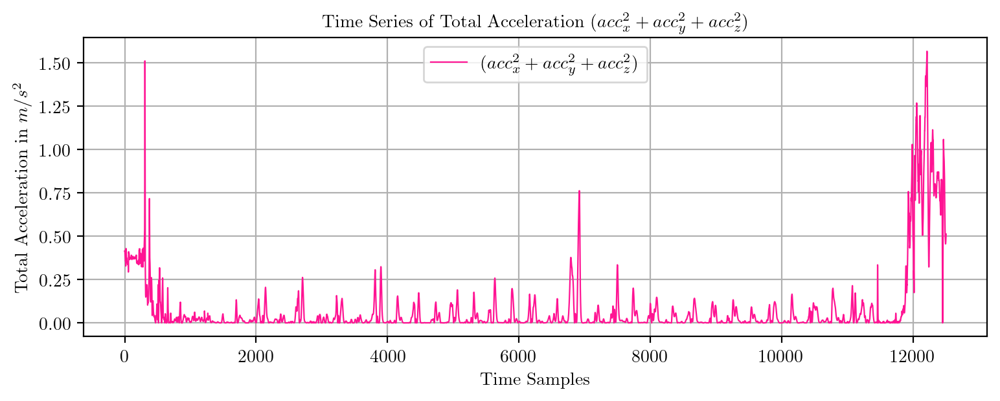

STANDING


In [108]:
PredictPlot('TS43Upstairs.csv', 1)
PredictPlot('TS43Upstairs.csv', 0)

Original Time Series


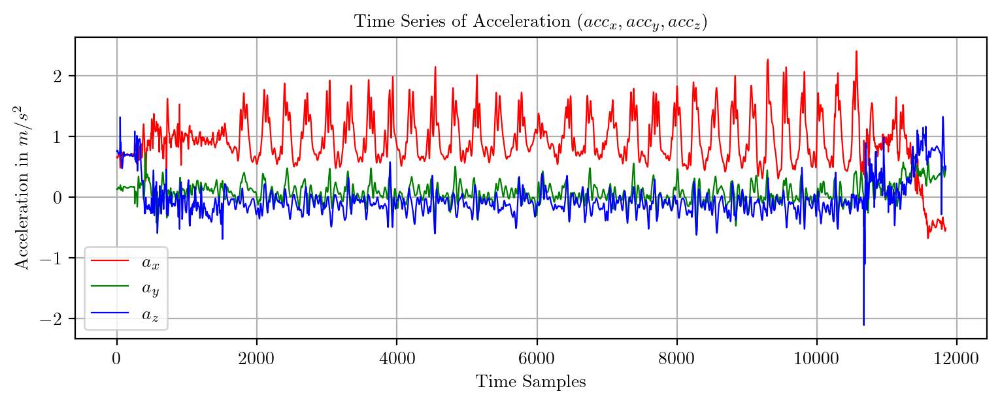

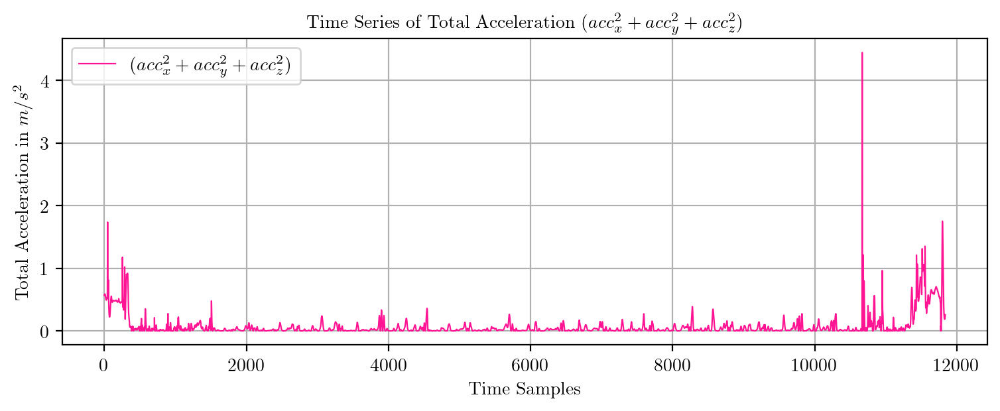

WALKING_UPSTAIRS


In [109]:
PredictPlot('TS44Downstairs.csv', 1)
PredictPlot('TS44Downstairs.csv', 0)

Original Time Series


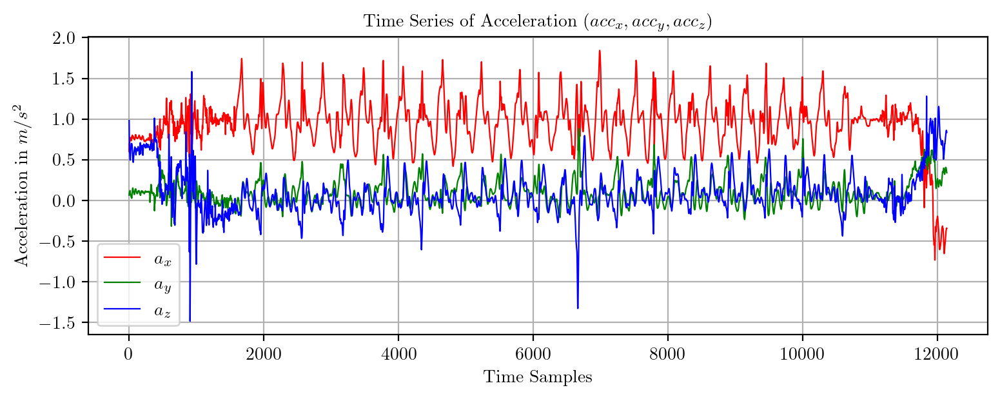

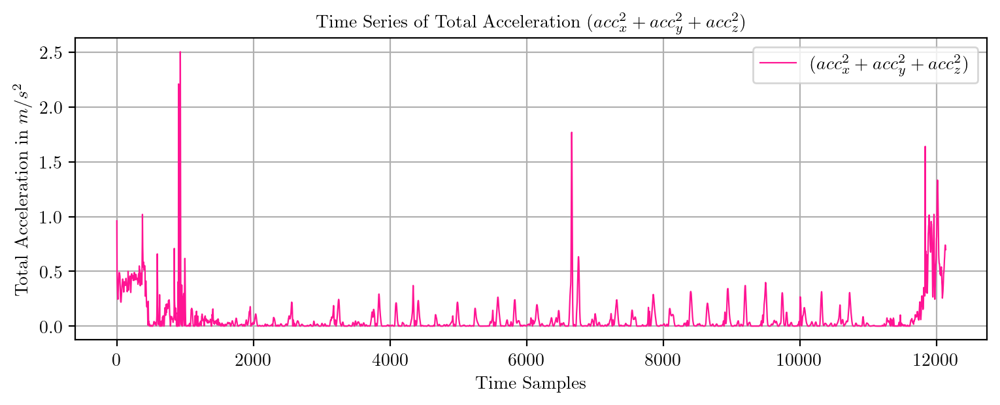

WALKING


In [110]:
PredictPlot('TS45Upstairs.csv', 1)
PredictPlot('TS45Upstairs.csv', 0)

Original Time Series


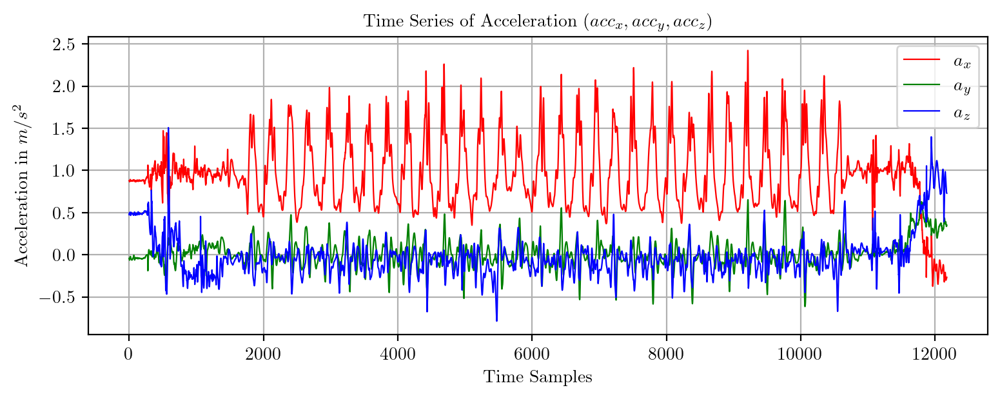

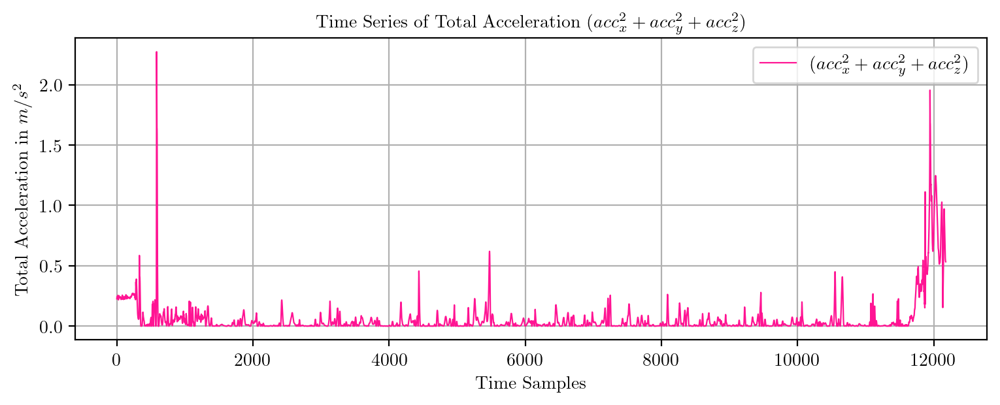

WALKING_DOWNSTAIRS


In [111]:
PredictPlot('TS46Downstairs.csv', 1)
PredictPlot('TS46Downstairs.csv', 0)

In [115]:
y = [1, 1, 2, 3, 3, 2, 4, 4, 5, 5, 2 ,1, 6, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 1, 1, 1, 1, 1, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3]
y_pred = [3, 3, 2, 1, 3, 3, 4, 4, 4, 4, 3, 3, 2, 6, 4, 6, 6, 6, 6, 4, 4, 6, 6, 2, 2, 2, 2, 2, 2, 1, 2, 1, 1, 1, 3, 2, 1, 1, 2, 5, 2, 1, 3]

In [116]:
cm = confusion_matrix(y, y_pred)
df_cm = pd.DataFrame(cm, index = [classT for classT in classes], columns = [classT for classT in classes])
df_cm

,WALKING,WALKING_UPSTAIRS,WALKING_DOWNSTAIRS,SITTING,STANDING,LAYING
WALKING,3,2,3,0,0,0
WALKING_UPSTAIRS,3,2,2,0,1,0
WALKING_DOWNSTAIRS,2,2,3,0,0,0
SITTING,0,0,0,3,0,4
STANDING,0,0,0,4,0,3
LAYING,0,6,0,0,0,0


In [117]:
print(classification_report(y, y_pred, labels = np.unique(y_pred)))

              precision    recall  f1-score   support

           1       0.38      0.38      0.38         8
           2       0.17      0.25      0.20         8
           3       0.38      0.43      0.40         7
           4       0.43      0.43      0.43         7
           5       0.00      0.00      0.00         7
           6       0.00      0.00      0.00         6

    accuracy                           0.26        43
   macro avg       0.22      0.25      0.23        43
weighted avg       0.23      0.26      0.24        43



In [118]:
def confMatrix(dataFrame, flag = 1, accuracies = None):
    if flag:
        plt.figure(figsize = (6, 6))
        ax = sns.heatmap(dataFrame, annot = True, cmap = "PuBu")
        plt.setp(ax.get_xticklabels(), rotation = 45, fontsize = 8)
        plt.setp(ax.get_yticklabels(), fontsize = 8)
        plt.ylabel("True label", fontsize = 18)
        plt.xlabel("Predicted label", fontsize = 18)
        plt.title(f"Accuracy = {accuracy_score(y, y_pred)*100: .4f}%", fontweight = "bold", fontsize = 13)
        plt.show()
    else:
        fig, axes = plt.subplots(3, 3, figsize = (25, 25))
        axes = axes.flatten()

        for i, df in enumerate(dataFrame):
            ax = sns.heatmap(df, annot = True, ax = axes[i], cbar = False, cmap = "PuBu")
            
            plt.setp(ax.get_xticklabels(), rotation = 45, fontsize = 6)
            plt.setp(ax.get_yticklabels(), fontsize = 8)
            ax.set_title(f"Depth = {i + 2}\nAccuracy = {accuracies[i] * 100: .4f}%", fontsize = 10)
            ax.set_ylabel("True label", fontsize = 12)
            ax.set_xlabel("Predicted label", fontsize = 12)
            
        plt.delaxes(axes[7])
        plt.delaxes(axes[8])
        plt.tight_layout()
        plt.subplots_adjust(wspace = 1.1, hspace = 1.1)
        plt.show()

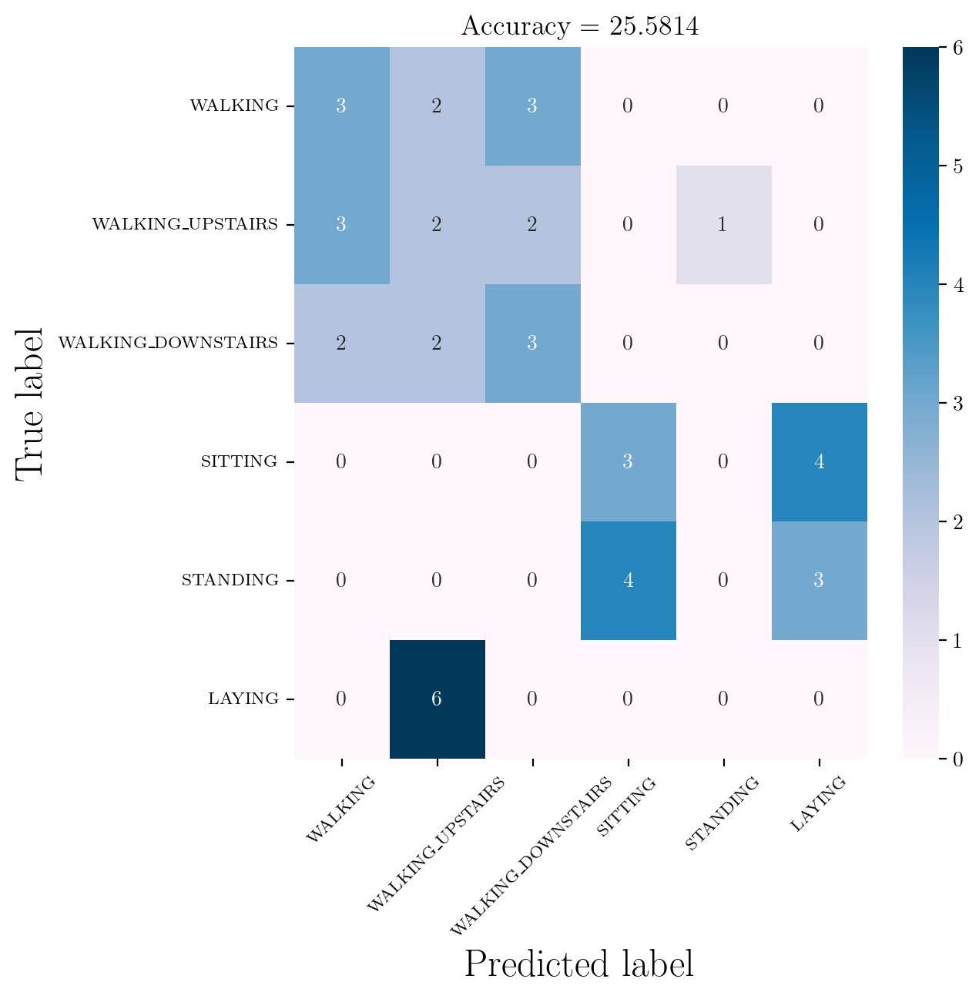

In [119]:
confMatrix(df_cm, 1)

In [112]:
classesN

{1: 'WALKING',
 2: 'WALKING_UPSTAIRS',
 3: 'WALKING_DOWNSTAIRS',
 4: 'SITTING',
 5: 'STANDING',
 6: 'LAYING'}